## Cycle GAN for T1 to T2  MRI image translation and vice versa
### Explanation
### Loading and Preprocessing
#### Changes 

#### Steps

=> Black part of the background was removed maintaining only the external contour as initially it seemed like a good idea to make the model only focus on the important, this strategy was later abandoned because it degraded the model performance and final prediction had a lot of artifact. The  artifact only happened on the models trained after removing the background, hence was not used in the final version.

=> Data Augmentation- As we had very few sample of both T1 and T2, augmentation was required as the model with only original data were failing miserably. Given the we were using images from medical domain, the augmentations that could be applied were limited. Of all the suggested/researched type augmentation, only zoom and mirror were implemented as they seemed to have worked for other researchers and chances of distortion were low
(https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7085309/, https://www.frontiersin.org/articles/10.3389/fncom.2019.00083/full). Also to visually confirm that the augmented images were not distorted, the images were saved and reloaded into the dataset instead of using keras augmentation pipeline

=> Resize : The images including the augmented images were resized to 256x256

=> Normalization : The images were normalized between -1 and 1. Also experimented with normalization between 0 and 1 but it gave sub optimal results


### Model Building
#### InstanceNormalization
InstanceNormalization from tensorflow_addons was used
==> Use pip install tensorflow_addons if package not installed
===> Details here : https://www.tensorflow.org/addons/api_docs/python/tfa/layers/InstanceNormalization
#### Initializers
=> tf.initializers.glorot_uniform() was used throughout
#### DownSample
=> LeakyReLU,ReLU and ELU were experimented with, with ELU/ReLU downgrading performace, LeakyReLU was retained
#### Upsample
=> TanH was used as it performed much better than LeakyReLU, ReLU and ELU
#### UNet
=> filtersize of 64 was used, with it doubling for every downsample and reducing by half for every upsample
#### Discriminator
=> Initially the discriminator was not very effective and so it was made more aggressive by adding extra blocks. The blocks were downsample=>BatchNormalization=>ReLU+>Maxpool X 3 , the maxpool was removed at the third layer.
#### Learning Rate Scheduler
=>LR Scheduler with the following parameters was used in the first few iterations:

initial_learning_rate = 2e-4,decay_steps = 1000 ,end_learning_rate = 0.0
lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(initial_learning_rate,decay_steps,end_learning_rate,power=1.0)
Optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule, beta_1=0.5, clipvalue=10.0,decay=1e-5)

The model had difficulty converging every time LR schdeuler was used, even when different parameters were used, hence it was abandoned in the final build
#### Loss functions
=> General loss function for cyclegan were used. During intital iterations, experimented with reducing weightage of identity loss and cycleloss, but it didn't really work, so standard cyclegan loss functions were retained

In [44]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import pandas as pd
import tensorflow as tf
import cv2
from PIL import Image, ImageOps
import random
import tensorflow_addons as tfa # See Notes Above

#### Loading the data

In [3]:
# Define the paths to the T1 and T2 image folders
#Local
# t1_folder = 'MRI+T1_T2+Dataset\Tr1\TrainT1'
# t2_folder = 'MRI+T1_T2+Dataset\Tr2\TrainT2'

# Jarvis
t1_folder = 'MRI+T1_T2+Dataset/Tr1/TrainT1'
t2_folder = 'MRI+T1_T2+Dataset/Tr2/TrainT2'
# List all files in the T1 and T2 folders
t1_files = os.listdir(t1_folder)
t2_files = os.listdir(t2_folder)


# Check the number of files in each folder
num_t1_images = len(t1_files)
num_t2_images = len(t2_files)

# Print the number of images in each folder
print("****Numnber of Images****")
print(f"Number of T1 images: {num_t1_images}")
print(f"Number of T2 images: {num_t2_images}")


****Numnber of Images****
Number of T1 images: 43
Number of T2 images: 46


### Checking the images

In [4]:
## Function to check basic properties of the images that we have
def checkimages(folder,filelist):
    for filename in filelist:
        image_path = os.path.join(folder, filename)
        image = Image.open(image_path)           
        width, height = image.size
        channels = image.mode
        print(f"Image: {filename} | Dimensions: {width} x {height} | Channels: {channels}")

In [5]:
# Checking T1 images
checkimages(t1_folder,t1_files)

Image: Image #10.png | Dimensions: 181 x 217 | Channels: L
Image: Image #11.png | Dimensions: 181 x 217 | Channels: L
Image: Image #12.png | Dimensions: 181 x 217 | Channels: L
Image: Image #13.png | Dimensions: 181 x 217 | Channels: L
Image: Image #14.png | Dimensions: 181 x 217 | Channels: L
Image: Image #15.png | Dimensions: 181 x 217 | Channels: L
Image: Image #16.png | Dimensions: 181 x 217 | Channels: L
Image: Image #17.png | Dimensions: 181 x 217 | Channels: L
Image: Image #18.png | Dimensions: 181 x 217 | Channels: L
Image: Image #19.png | Dimensions: 181 x 217 | Channels: L
Image: Image #23.png | Dimensions: 181 x 217 | Channels: L
Image: Image #24.png | Dimensions: 181 x 217 | Channels: L
Image: Image #25.png | Dimensions: 181 x 217 | Channels: L
Image: Image #26.png | Dimensions: 181 x 217 | Channels: L
Image: Image #27.png | Dimensions: 181 x 217 | Channels: L
Image: Image #28.png | Dimensions: 181 x 217 | Channels: L
Image: Image #29.png | Dimensions: 181 x 217 | Channels:

In [6]:
# Checking T2 images
checkimages(t2_folder,t2_files)

Image: Image #100.png | Dimensions: 181 x 217 | Channels: L
Image: Image #111.png | Dimensions: 181 x 217 | Channels: L
Image: Image #112.png | Dimensions: 181 x 217 | Channels: L
Image: Image #113.png | Dimensions: 181 x 217 | Channels: L
Image: Image #114.png | Dimensions: 181 x 217 | Channels: L
Image: Image #115.png | Dimensions: 181 x 217 | Channels: L
Image: Image #116.png | Dimensions: 181 x 217 | Channels: L
Image: Image #117.png | Dimensions: 181 x 217 | Channels: L
Image: Image #118.png | Dimensions: 181 x 217 | Channels: L
Image: Image #119.png | Dimensions: 181 x 217 | Channels: L
Image: Image #120.png | Dimensions: 181 x 217 | Channels: L
Image: Image #121.png | Dimensions: 181 x 217 | Channels: L
Image: Image #122.png | Dimensions: 181 x 217 | Channels: L
Image: Image #123.png | Dimensions: 181 x 217 | Channels: L
Image: Image #124.png | Dimensions: 181 x 217 | Channels: L
Image: Image #125.png | Dimensions: 181 x 217 | Channels: L
Image: Image #70.png | Dimensions: 181 x

In [7]:
# Observations
# All Images are of size 181x217 for both T1 and T2
# All Images are Greyscale (Channel L)

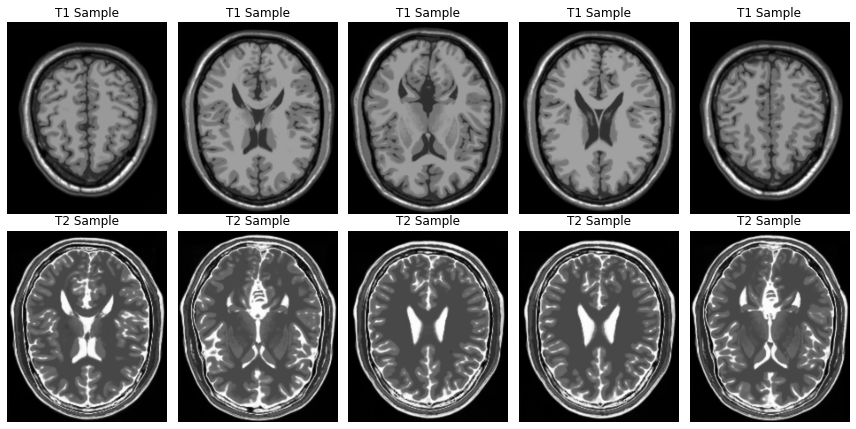

In [8]:
## Visualizing a few of the images from each folder
#Lets see 5 random images from each set
num_samples = 5

# Load T1 images
t1_sample_files = np.random.choice(t1_files, num_samples, replace=False)
t1_sample_images = [Image.open(os.path.join(t1_folder, filename)) for filename in t1_sample_files]

# Load T2 images
t2_sample_files = np.random.choice(t2_files, num_samples, replace=False)
t2_sample_images = [Image.open(os.path.join(t2_folder, filename)) for filename in t2_sample_files]

# Display T1 sample images
plt.figure(figsize=(12, 6))
for i in range(num_samples):
    plt.subplot(2, num_samples, i + 1)
    plt.imshow(t1_sample_images[i], cmap='gray')
    plt.title('T1 Sample')
    plt.axis('off')

# Display T2 sample images
for i in range(num_samples):
    plt.subplot(2, num_samples, num_samples + i + 1)
    plt.imshow(t2_sample_images[i], cmap='gray')
    plt.title('T2 Sample')
    plt.axis('off')

plt.tight_layout()
plt.show()


### Augmentation

In [9]:
### Random zoom - Returns a image zoomed between a range, also ensured that the image returned is the original dimenstion
### Also ensured that returned images also only have the L channel

def zoom_in_out(image, zoom_range):
    width, height = image.size
    zoom_factor = 1 + random.uniform(zoom_range[0], zoom_range[1])
    
    if zoom_factor > 1:
        # Calculate the new size based on the original size
        new_width = int(width / zoom_factor)
        new_height = int(height / zoom_factor)
        left = (width - new_width) // 2
        upper = (height - new_height) // 2        
        # Crop the zoomed region from the original image
        cropped = image.crop((left, upper, left + new_width, upper + new_height))
        
        # Resize the cropped image back to the original size
        zoomed = cropped.resize((width, height), Image.LANCZOS)
        zoomed = zoomed.convert('L')
        return zoomed
    else:
        # Resize the image to fit within the original size
        new_width = int(width * zoom_factor)
        new_height = int(height * zoom_factor)
        zoomed = image.resize((new_width, new_height), Image.LANCZOS)
        
        # Create a black background image of the original size
        black_image = Image.new('RGB', (width, height), (0, 0, 0))
        
        # Calculate the position to paste the zoomed image on the black background
        left = (width - new_width) // 2
        upper = (height - new_height) // 2
        
        # Paste the zoomed image onto the black background
        black_image.paste(zoomed, (left, upper))
        black_image = black_image.convert('L')
        return black_image


In [10]:
### Mirror The Image - Horizontal only
### Also ensured that returned images also only have the L channel
def flip_horizontal(image):
    flipped = ImageOps.mirror(image)
    flipped = flipped.convert('L')
    return flipped

In [11]:
# Data augmentation parameters
zoom_range = (-0.075, 0.075)  # Adjust these values as needed

# Perform data augmentation and save the augmented images
for folder, files in [(t1_folder, t1_files), (t2_folder, t2_files)]:
    for image_file in files:
        image_path = os.path.join(folder, image_file)
        original_image = Image.open(image_path)

        augmented_images = []

        # Apply zoom augmentations
        for i in range(3):
            zoomed = zoom_in_out(original_image, zoom_range)
            augmented_images.append(zoomed)

        # Apply flip augmentation
        flipped = flip_horizontal(original_image)
        augmented_images.append(flipped)

        # Save augmented images
        for i, augmented_image in enumerate(augmented_images):
            new_filename = os.path.splitext(image_file)[0] + f'_aug_{i+1}.png'
            new_image_path = os.path.join(folder, new_filename)
            augmented_image.save(new_image_path)

### Preprocessing

In [12]:
## Function to remove the blackbackground
#### Please note: Function call to this function has been commented out in the next code block - Explanation in the start
#### Retaining code in case anyone wants to test the impact of the function on the model


def removeNonMri(image, threshold=10):
    # Threshold the image to binarize
    _, binarized = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)   
    # Find contours
    contours, _ = cv2.findContours(binarized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)    
    # If no contours are detected, just return the original image
    if not contours:
        return image    
    # Find the largest contour, which should be the brain region
    largest_contour = max(contours, key=cv2.contourArea)   
    # Create a mask with the same size as the image filled with white
    mask = np.ones_like(image) * 255   
    # Draw the largest contour (brain region) on the mask with black
    cv2.drawContours(mask, [largest_contour], -1, (0), thickness=cv2.FILLED)    
    # Combine the original image with the mask using bitwise operations
    processed_image = cv2.bitwise_or(image, mask)    
    # Display the input and processed images side by side
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(5, 10))
#     ax1.imshow(image, cmap='gray')
#     ax1.set_title('Input Image')
#     ax1.axis('off')    
#     ax2.imshow(processed_image, cmap='gray')
#     ax2.set_title('Processed Image')
#     ax2.axis('off')
#     plt.tight_layout()
#     plt.show()
    return processed_image

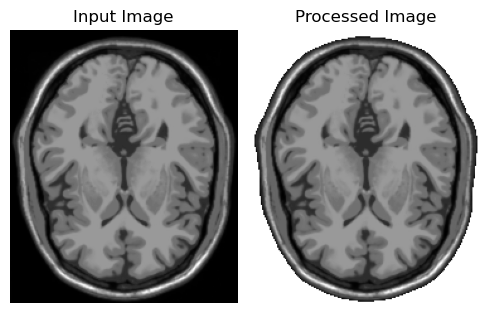

In [13]:
# The function above when used preprocessed the image as following
from IPython.display import Image as i, display

# Display the GIF in the notebook
display(i(filename="Black Removed.png"))

In [14]:
## Main function that calls all the preprocessing steps which include
# Resize, convert black regions outside the brain to white, and normalize. Returns the np array  images
# Note : Step to convert black regions outside the brain to white has been commented out but can be used if needed
def preprocess_images(image_list, size):

    processed_images = []
    
    for img in image_list:
        # Convert PIL Image to numpy array
        img_array = np.array(img)
        
        # Convert black regions outside the brain to white
        #img_array = removeNonMri(img_array)  #=Pre-Process supressed as it had negative effect==> See Explanation Above
        
        # Convert numpy array back to PIL Image
        processed_img = Image.fromarray(img_array)
        
        # Resize
        resized_img = processed_img.resize((size, size))
        
        # Normalize
        normalized_img = (np.array(resized_img) / 127.5) - 1

        
        processed_images.append(normalized_img)
    
    return np.array(processed_images)

In [15]:
# The Preprocessing step has to be applied to all the images including the newly added Augmented images, so 
# we will initialize the t1_files_new and t2_files_new variable so now it holds the updated file list

## Reinitialize t1_files and t2_files
t1_files_new = os.listdir(t1_folder)
t2_files_new = os.listdir(t2_folder)
# Total Number files in each folder after Augmentation
num_t1_images=len(t1_files_new)
num_t2_images=len(t2_files_new)

t1_all_images = [Image.open(os.path.join(t1_folder, filename)) for filename in t1_files_new]
t2_all_images = [Image.open(os.path.join(t2_folder, filename)) for filename in t2_files_new]

t1_processed_images = preprocess_images(t1_all_images,256) #--- Using 256 as resize parameter
t2_processed_images = preprocess_images(t2_all_images,256) #--- Using 256 as resize parameter



T1 Image 1 dimensions: (256, 256)


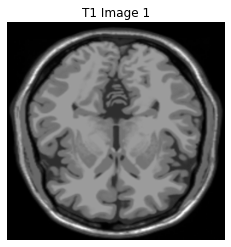

T1 Image 101 dimensions: (256, 256)


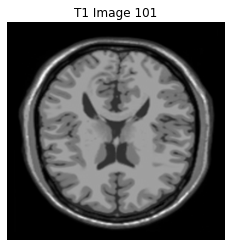

T1 Image 201 dimensions: (256, 256)


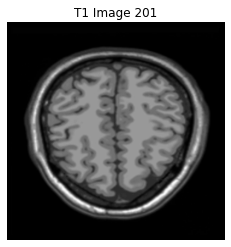

-------------
T2 Image 1 dimensions: (256, 256)


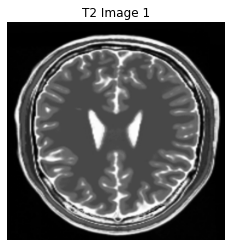

T2 Image 101 dimensions: (256, 256)


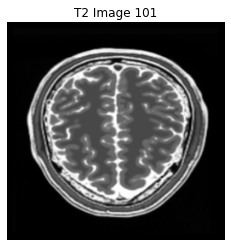

T2 Image 201 dimensions: (256, 256)


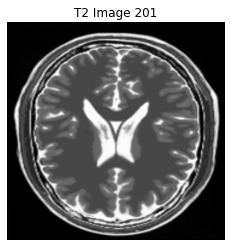

In [16]:
# Checking a few of the newly processed images
for i in range(0,num_t1_images,100):
    print(f"T1 Image {i+1} dimensions: {t1_processed_images[i].shape}")
    plt.imshow(t1_processed_images[i], cmap='gray')
    plt.title(f"T1 Image {i+1}")
    plt.axis('off')
    plt.show()
print("-------------")    
for i in range(0,num_t2_images,100):
    print(f"T2 Image {i+1} dimensions: {t2_processed_images[i].shape}")
    plt.imshow(t2_processed_images[i], cmap='gray')
    plt.title(f"T2 Image {i+1}")
    plt.axis('off')
    plt.show()


In [17]:
#Reshaping
t1_processed_images = t1_processed_images.reshape(-1, 256, 256, 1).astype(np.float32)
t2_processed_images = t2_processed_images.reshape(-1, 256, 256, 1).astype(np.float32)


In [18]:
### Batching and getting it ready for model!
BATCH_SIZE = 4

# Convert preprocessed images to TensorFlow tensors
t1_dataset = tf.data.Dataset.from_tensor_slices(t1_processed_images)
t2_dataset = tf.data.Dataset.from_tensor_slices(t2_processed_images)

# Shuffle the datasets
t1_dataset = t1_dataset.shuffle(len(t1_processed_images), seed=42)
t2_dataset = t2_dataset.shuffle(len(t2_processed_images), seed=42)

# Batch the datasets
t1_dataset = t1_dataset.batch(BATCH_SIZE)
t2_dataset = t2_dataset.batch(BATCH_SIZE)

# Use AUTOTUNE for parallel processing
t1_dataset = t1_dataset.prefetch(tf.data.experimental.AUTOTUNE)
t2_dataset = t2_dataset.prefetch(tf.data.experimental.AUTOTUNE)

2023-08-18 22:40:04.068926: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2023-08-18 22:40:04.068992: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46482 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:3d:00.0, compute capability: 8.6


### Model Building


#### Downsampling function

In [19]:
## Function to downsample - Decompose Image
def downsample(filters, size, apply_norm=True):
    
    initializer = tf.initializers.glorot_uniform()
    
    model = tf.keras.Sequential()
    
    # Convolutional layer
    model.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    
    # Normalization layer
    if apply_norm:
        model.add(tfa.layers.InstanceNormalization())
    
    # Leaky ReLU activation
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    
    return model


#### Upsampling function

In [20]:
## Function to Upsample - Recompose Image
def upsample(filters, size, apply_dropout=False):
    initializer = tf.initializers.glorot_uniform()
    
    model = tf.keras.Sequential()
    
    # Transposed convolutional layer
    model.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                              kernel_initializer=initializer, use_bias=False))
    
    # Normalization layer
    model.add(tfa.layers.InstanceNormalization())
    
    # Dropout layer (conditionally)
    if apply_dropout:
        model.add(tf.keras.layers.Dropout(0.5))
    
    # ReLU activation layer
    #model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.Activation('tanh')) #---> Tanh used
    
    return model


#### Unet Architecture


In [21]:
## UNET##
# Function that creates the UNet Architecture -- 
# Downsamples an image and than upsamples them, while maintaining downsample state that is passed to upsample via skip
# connections


def unet_generator(input_shape=(256, 256, 1), num_filters=64):
    down_stack = [
        downsample(num_filters, 4, apply_norm=False),   # (bs, 128, 128, num_filters)
        downsample(num_filters * 2, 4),         # (bs, 64, 64, num_filters*2)
        downsample(num_filters * 4, 4),         # (bs, 32, 32, num_filters*4)
        downsample(num_filters * 8, 4),         # (bs, 16, 16, num_filters*8)
    ]
    up_stack = [
        upsample(num_filters * 8, 4),     # (bs, 32, 32, num_filters*8)
        upsample(num_filters * 4, 4),     # (bs, 64, 64, num_filters*4)
        upsample(num_filters * 2, 4),     # (bs, 128, 128, num_filters*2)
        upsample(num_filters, 4),         # (bs, 256, 256, num_filters)
    ]
    initializer = tf.initializers.glorot_uniform()
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh')  # (bs, 256, 256, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)


In [22]:
#Initialize our generators 
generator_g = unet_generator()
generator_f = unet_generator()

In [23]:
## Lets see what the generator model looks like
generator_g.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 64  1024        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  131328      ['sequential[0][0]']             
                                                                                              

#### Discriminator function

In [24]:
## Discriminator function 
# Used as a  binary classifier to see if the images are real or fake

def discriminator():
    initializer = tf.initializers.glorot_uniform()
    
    inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
    x = inp
    
    # First Downsampling Block
    down1 = downsample(32, 4, apply_norm=False)(x) 
    norm1 = tf.keras.layers.BatchNormalization()(down1)
    relu1 = tf.keras.layers.ReLU()(norm1)
    max_pool1 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(relu1)
    
    # Second Downsampling Block
    down2 = downsample(64, 4)(max_pool1)  
    norm2 = tf.keras.layers.BatchNormalization()(down2)
    relu2 = tf.keras.layers.ReLU()(norm2)
    max_pool2 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(relu2)
    dropout2 = tf.keras.layers.Dropout(0.25)(max_pool2)
    
    # Third Downsampling Block
    down3 = downsample(64, 4)(dropout2)  
    norm3 = tf.keras.layers.BatchNormalization()(down3)
    relu3 = tf.keras.layers.ReLU()(norm3)
    # No Maxpooling - Was dropped as it worked better without this
    
    # Additional Convolution Layer
    conv = tf.keras.layers.Conv2D(128, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(relu3)
    norm4 = tf.keras.layers.BatchNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm4)
    
    # Output Layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(leaky_relu)
    
    return tf.keras.Model(inputs=inp, outputs=last)


In [25]:
## Initializing discriminators for each class of image (2)
discriminator_x = discriminator()
discriminator_y = discriminator()

In [26]:
discriminator_x.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_16 (Sequential)  (None, 128, 128, 32)      512       
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 32)     128       
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 128, 128, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 32)       0         
 )                                                               
                                                                 
 sequential_17 (Sequential)  (None, 32, 32, 64)        3289

#### Loss Functions

In [27]:
## Using Binary Cross Entropy
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [28]:
# Loss for discriminator
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [29]:
# Loss for Generator 
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [30]:
# Cycle loss - Calculates loss after an image is cycled = A=>B=>A
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

In [31]:
# Identity Loss - quantifies the dissimilarity between an input image and its generated output 
# when passed through the generator for the same class
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

In [32]:
## Optimizers -- 
##See Start for explantion on why the Learning Rate Scheduler was removed
generator_g_optimizer = tf.keras.optimizers.Adam()
generator_f_optimizer = tf.keras.optimizers.Adam()
discriminator_x_optimizer = tf.keras.optimizers.Adam()
discriminator_y_optimizer = tf.keras.optimizers.Adam()


In [33]:
## Defining the number of epochs we want to run the model for
EPOCHS = 150

In [34]:
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [35]:
def generate_images(model1, test_input1, model2, test_input2):
    # Convert T1 to T2
    prediction1 = model1(test_input1)
    
    # Convert T2 to T1
    prediction2 = model2(test_input2)
    
    # Cycle back: T2 to T1 (using prediction1)
    cycle_back1 = model2(prediction1)
    
    # Cycle back: T1 to T2 (using prediction2)
    cycle_back2 = model1(prediction2)
    
    plt.figure(figsize=(12, 4))
    
    display_list = [test_input1[0], prediction1[0], cycle_back1[0], 
                    test_input2[0], prediction2[0], cycle_back2[0]]
    title = ['Input T1', 'To T2', 'Cycle back to T1', 
             'Input T2', 'To T1', 'Cycle back to T2']
    
    for i in range(6):
        plt.subplot(1, 6, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('RUN_1_image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()


In [36]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))
    
    # Return the losses for monitoring
    return total_gen_g_loss, total_gen_f_loss, disc_x_loss, disc_y_loss

### Starting The Run!

2023-08-18 22:40:18.491006: I tensorflow/stream_executor/cuda/cuda_dnn.cc:377] Loaded cuDNN version 8302


Epoch 1/150
Generator G Loss: 11.6990, Generator F Loss: 11.9128
Discriminator X Loss: 0.1861, Discriminator Y Loss: 0.2361


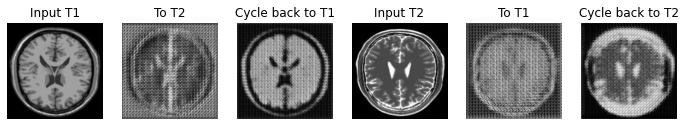

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-1
Epoch 2/150
Generator G Loss: 10.4818, Generator F Loss: 10.6200
Discriminator X Loss: 0.0693, Discriminator Y Loss: 0.0729


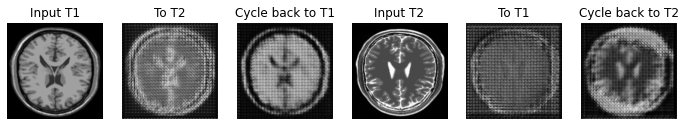

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-2
Epoch 3/150
Generator G Loss: 10.1762, Generator F Loss: 10.2470
Discriminator X Loss: 0.0723, Discriminator Y Loss: 0.1062


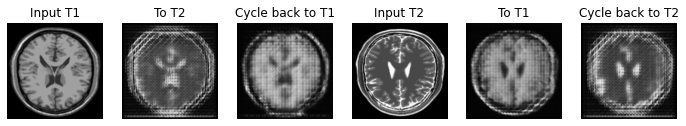

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-3
Epoch 4/150
Generator G Loss: 10.3554, Generator F Loss: 10.2033
Discriminator X Loss: 0.1814, Discriminator Y Loss: 0.1574


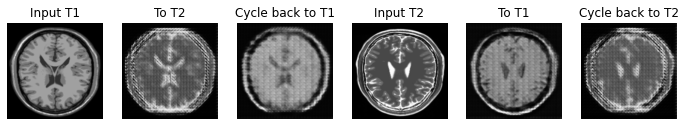

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-4
Epoch 5/150
Generator G Loss: 9.5517, Generator F Loss: 8.9318
Discriminator X Loss: 0.1694, Discriminator Y Loss: 0.1369


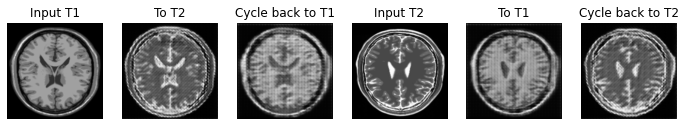

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-5
Epoch 6/150
Generator G Loss: 8.7863, Generator F Loss: 8.7749
Discriminator X Loss: 0.2188, Discriminator Y Loss: 0.1729


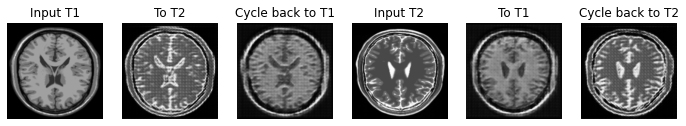

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-6
Epoch 7/150
Generator G Loss: 8.2455, Generator F Loss: 7.6672
Discriminator X Loss: 0.3103, Discriminator Y Loss: 0.2197


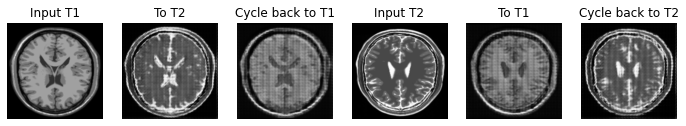

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-7
Epoch 8/150
Generator G Loss: 7.8792, Generator F Loss: 7.1555
Discriminator X Loss: 0.2464, Discriminator Y Loss: 0.2456


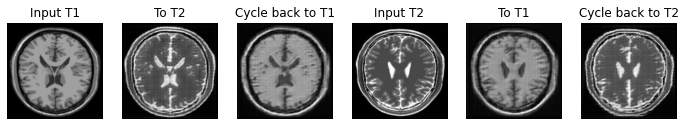

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-8
Epoch 9/150
Generator G Loss: 7.3435, Generator F Loss: 7.6655
Discriminator X Loss: 0.2973, Discriminator Y Loss: 0.3264


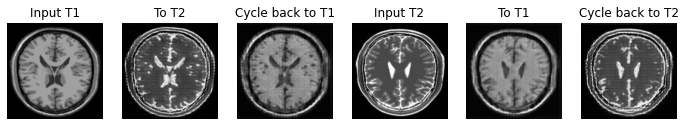

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-9
Epoch 10/150
Generator G Loss: 6.9497, Generator F Loss: 8.3407
Discriminator X Loss: 0.1734, Discriminator Y Loss: 0.2449


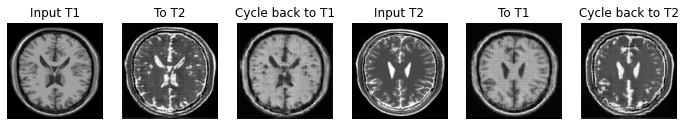

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-10
Epoch 11/150
Generator G Loss: 7.4615, Generator F Loss: 6.3471
Discriminator X Loss: 0.4351, Discriminator Y Loss: 0.2846


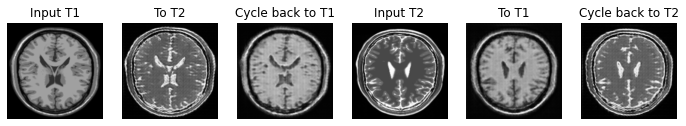

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-11
Epoch 12/150
Generator G Loss: 8.6598, Generator F Loss: 7.4606
Discriminator X Loss: 0.2923, Discriminator Y Loss: 0.2227


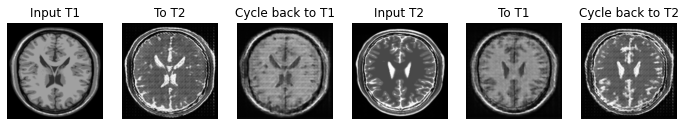

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-12
Epoch 13/150
Generator G Loss: 7.5733, Generator F Loss: 7.0191
Discriminator X Loss: 0.3148, Discriminator Y Loss: 0.2233


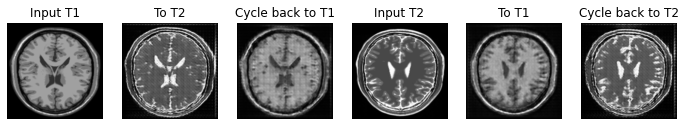

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-13
Epoch 14/150
Generator G Loss: 6.8623, Generator F Loss: 7.0768
Discriminator X Loss: 0.2448, Discriminator Y Loss: 0.2782


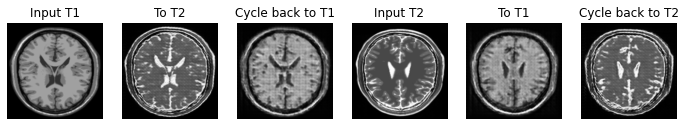

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-14
Epoch 15/150
Generator G Loss: 7.0312, Generator F Loss: 7.4786
Discriminator X Loss: 0.3084, Discriminator Y Loss: 0.3198


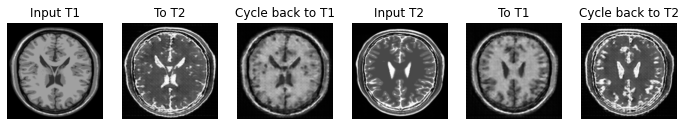

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-15
Epoch 16/150
Generator G Loss: 7.7406, Generator F Loss: 6.9441
Discriminator X Loss: 0.2536, Discriminator Y Loss: 0.2045


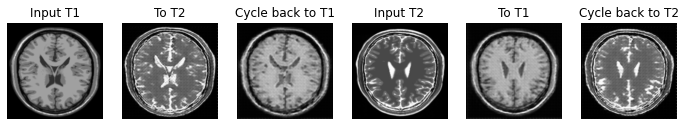

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-16
Epoch 17/150
Generator G Loss: 7.8680, Generator F Loss: 5.2028
Discriminator X Loss: 0.4188, Discriminator Y Loss: 0.2002


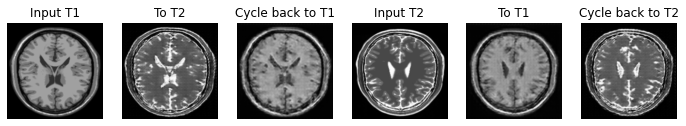

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-17
Epoch 18/150
Generator G Loss: 7.5607, Generator F Loss: 5.4715
Discriminator X Loss: 0.4719, Discriminator Y Loss: 0.2930


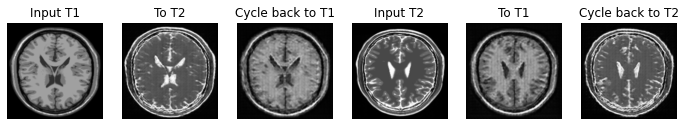

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-18
Epoch 19/150
Generator G Loss: 8.0495, Generator F Loss: 4.2997
Discriminator X Loss: 0.5554, Discriminator Y Loss: 0.2111


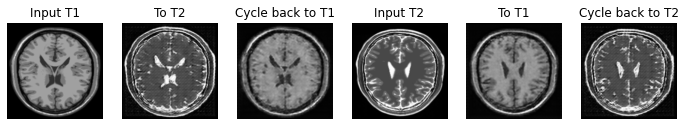

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-19
Epoch 20/150
Generator G Loss: 8.0074, Generator F Loss: 4.5274
Discriminator X Loss: 0.6038, Discriminator Y Loss: 0.2596


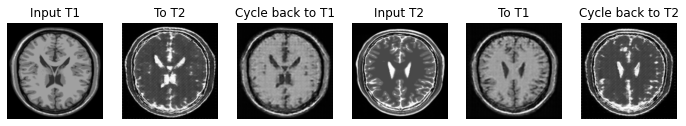

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-20
Epoch 21/150
Generator G Loss: 7.5045, Generator F Loss: 4.0186
Discriminator X Loss: 0.6049, Discriminator Y Loss: 0.2465


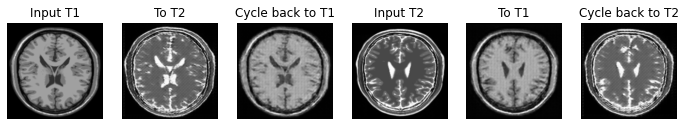

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-21
Epoch 22/150
Generator G Loss: 6.4013, Generator F Loss: 3.9027
Discriminator X Loss: 0.5357, Discriminator Y Loss: 0.2453


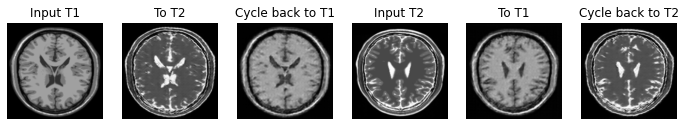

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-22
Epoch 23/150
Generator G Loss: 8.1735, Generator F Loss: 3.9179
Discriminator X Loss: 0.6393, Discriminator Y Loss: 0.1424


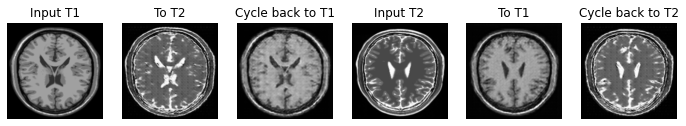

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-23
Epoch 24/150
Generator G Loss: 7.7661, Generator F Loss: 4.0100
Discriminator X Loss: 0.5796, Discriminator Y Loss: 0.2010


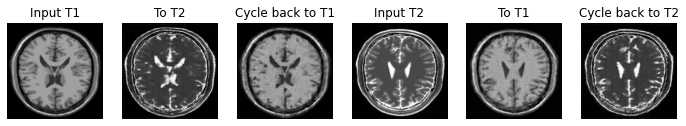

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-24
Epoch 25/150
Generator G Loss: 7.9853, Generator F Loss: 3.8202
Discriminator X Loss: 0.6065, Discriminator Y Loss: 0.2581


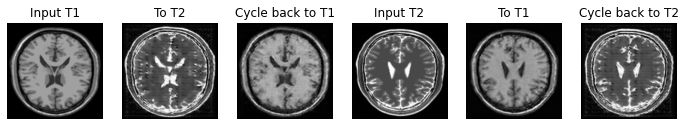

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-25
Epoch 26/150
Generator G Loss: 7.3367, Generator F Loss: 3.5916
Discriminator X Loss: 0.6356, Discriminator Y Loss: 0.2345


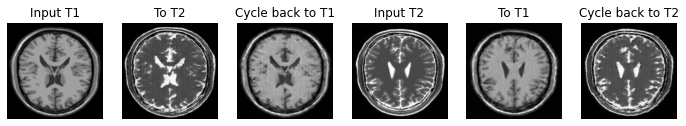

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-26
Epoch 27/150
Generator G Loss: 7.1126, Generator F Loss: 3.4634
Discriminator X Loss: 0.6115, Discriminator Y Loss: 0.2653


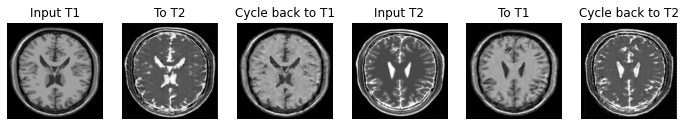

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-27
Epoch 28/150
Generator G Loss: 6.0082, Generator F Loss: 3.4029
Discriminator X Loss: 0.6822, Discriminator Y Loss: 0.2921


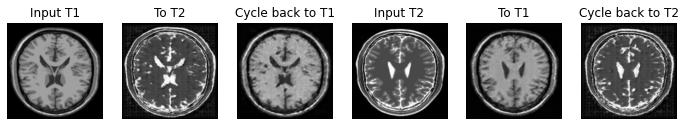

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-28
Epoch 29/150
Generator G Loss: 8.1813, Generator F Loss: 3.5230
Discriminator X Loss: 0.6222, Discriminator Y Loss: 0.1973


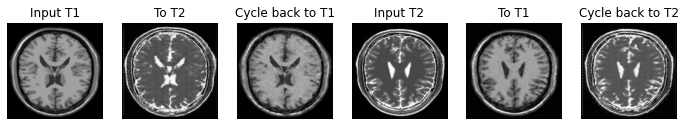

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-29
Epoch 30/150
Generator G Loss: 8.4615, Generator F Loss: 3.3715
Discriminator X Loss: 0.6409, Discriminator Y Loss: 0.1716


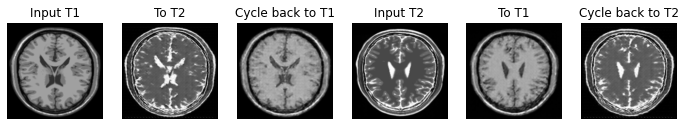

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-30
Epoch 31/150
Generator G Loss: 8.1178, Generator F Loss: 3.2989
Discriminator X Loss: 0.6531, Discriminator Y Loss: 0.1348


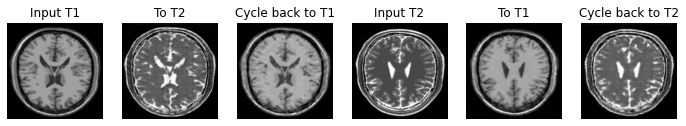

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-31
Epoch 32/150
Generator G Loss: 9.5173, Generator F Loss: 3.3272
Discriminator X Loss: 0.6525, Discriminator Y Loss: 0.1652


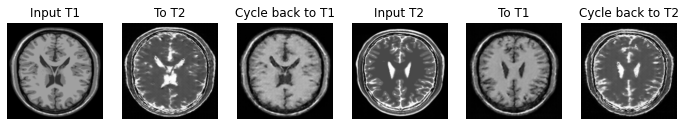

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-32
Epoch 33/150
Generator G Loss: 3.7348, Generator F Loss: 3.0790
Discriminator X Loss: 0.6688, Discriminator Y Loss: 0.6495


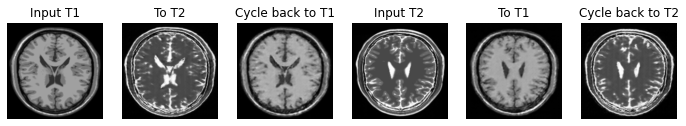

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-33
Epoch 34/150
Generator G Loss: 3.2351, Generator F Loss: 2.8637
Discriminator X Loss: 0.7060, Discriminator Y Loss: 0.6365


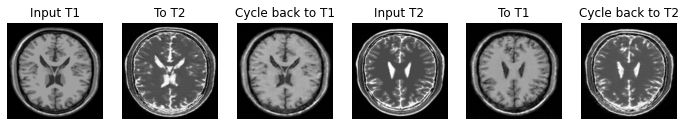

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-34
Epoch 35/150
Generator G Loss: 3.0515, Generator F Loss: 2.6613
Discriminator X Loss: 0.6842, Discriminator Y Loss: 0.6193


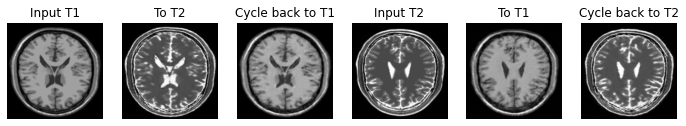

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-35
Epoch 36/150
Generator G Loss: 2.9926, Generator F Loss: 2.6246
Discriminator X Loss: 0.6967, Discriminator Y Loss: 0.6022


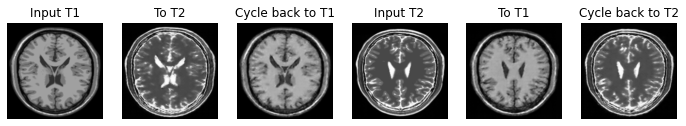

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-36
Epoch 37/150
Generator G Loss: 2.9644, Generator F Loss: 2.5408
Discriminator X Loss: 0.6814, Discriminator Y Loss: 0.5951


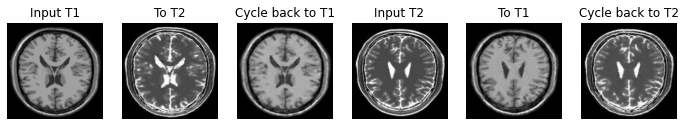

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-37
Epoch 38/150
Generator G Loss: 2.9159, Generator F Loss: 2.4681
Discriminator X Loss: 0.6870, Discriminator Y Loss: 0.5909


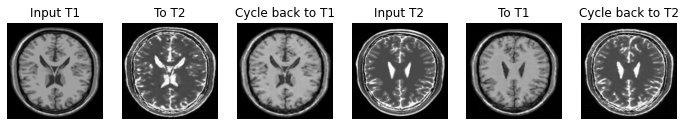

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-38
Epoch 39/150
Generator G Loss: 2.8553, Generator F Loss: 2.4523
Discriminator X Loss: 0.7088, Discriminator Y Loss: 0.6031


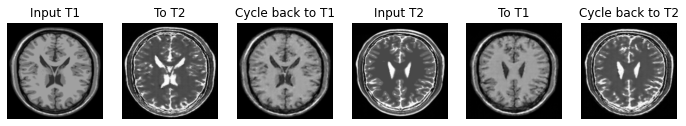

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-39
Epoch 40/150
Generator G Loss: 2.8846, Generator F Loss: 2.3884
Discriminator X Loss: 0.6860, Discriminator Y Loss: 0.5940


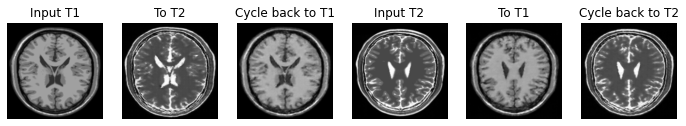

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-40
Epoch 41/150
Generator G Loss: 2.7327, Generator F Loss: 2.3791
Discriminator X Loss: 0.6883, Discriminator Y Loss: 0.6502


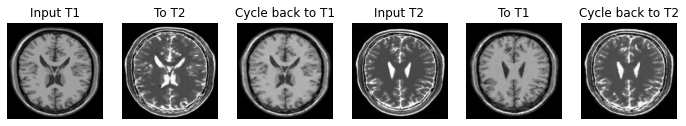

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-41
Epoch 42/150
Generator G Loss: 2.6453, Generator F Loss: 2.2727
Discriminator X Loss: 0.7041, Discriminator Y Loss: 0.6147


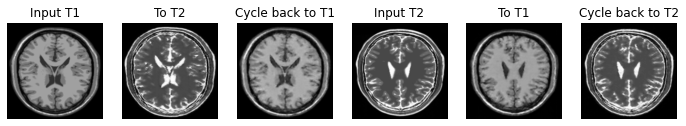

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-42
Epoch 43/150
Generator G Loss: 2.5499, Generator F Loss: 2.2556
Discriminator X Loss: 0.7028, Discriminator Y Loss: 0.6474


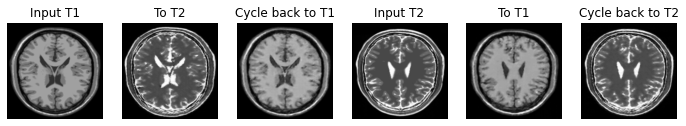

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-43
Epoch 44/150
Generator G Loss: 2.4269, Generator F Loss: 2.1798
Discriminator X Loss: 0.6941, Discriminator Y Loss: 0.6444


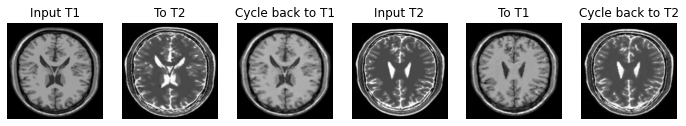

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-44
Epoch 45/150
Generator G Loss: 2.4161, Generator F Loss: 2.1755
Discriminator X Loss: 0.6864, Discriminator Y Loss: 0.6533


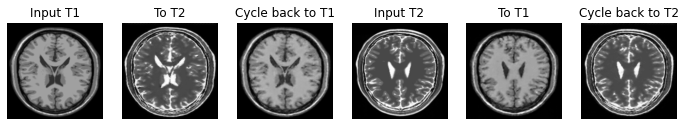

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-45
Epoch 46/150
Generator G Loss: 2.3231, Generator F Loss: 2.1417
Discriminator X Loss: 0.7043, Discriminator Y Loss: 0.6764


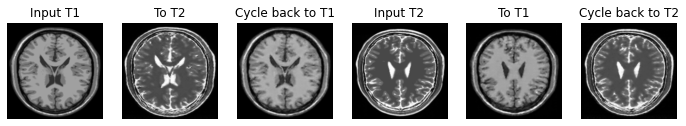

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-46
Epoch 47/150
Generator G Loss: 2.3596, Generator F Loss: 2.0998
Discriminator X Loss: 0.6966, Discriminator Y Loss: 0.6788


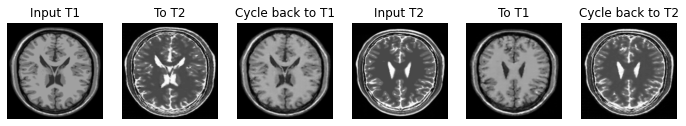

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-47
Epoch 48/150
Generator G Loss: 2.2315, Generator F Loss: 2.0433
Discriminator X Loss: 0.6988, Discriminator Y Loss: 0.6956


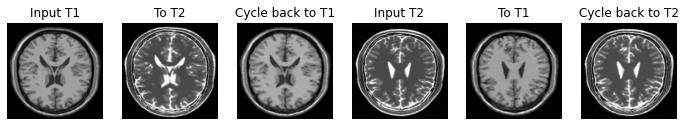

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-48
Epoch 49/150
Generator G Loss: 2.0987, Generator F Loss: 1.9836
Discriminator X Loss: 0.6951, Discriminator Y Loss: 0.7006


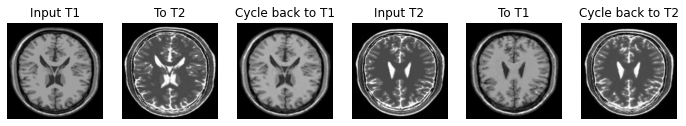

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-49
Epoch 50/150
Generator G Loss: 2.0372, Generator F Loss: 1.9552
Discriminator X Loss: 0.7042, Discriminator Y Loss: 0.6919


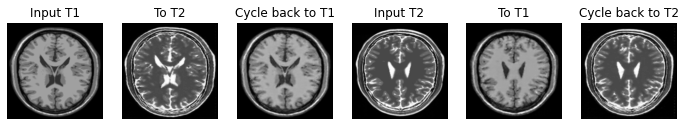

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-50
Epoch 51/150
Generator G Loss: 2.0196, Generator F Loss: 1.9181
Discriminator X Loss: 0.6929, Discriminator Y Loss: 0.6886


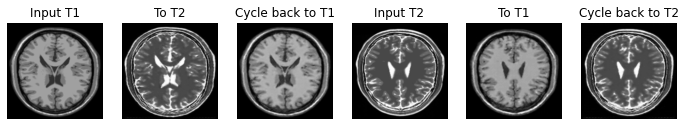

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-51
Epoch 52/150
Generator G Loss: 1.9514, Generator F Loss: 1.8847
Discriminator X Loss: 0.6940, Discriminator Y Loss: 0.7077


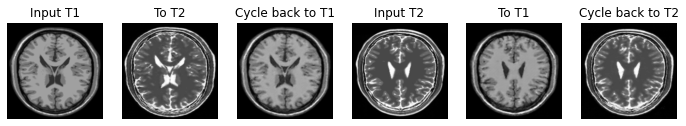

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-52
Epoch 53/150
Generator G Loss: 1.9255, Generator F Loss: 1.8641
Discriminator X Loss: 0.6910, Discriminator Y Loss: 0.7000


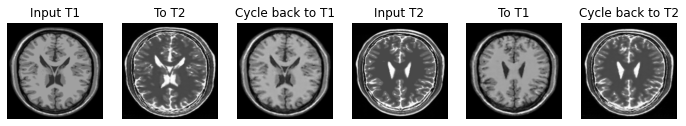

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-53
Epoch 54/150
Generator G Loss: 1.8805, Generator F Loss: 1.8340
Discriminator X Loss: 0.6916, Discriminator Y Loss: 0.7035


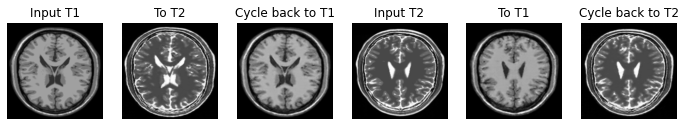

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-54
Epoch 55/150
Generator G Loss: 1.8540, Generator F Loss: 1.8137
Discriminator X Loss: 0.6933, Discriminator Y Loss: 0.6947


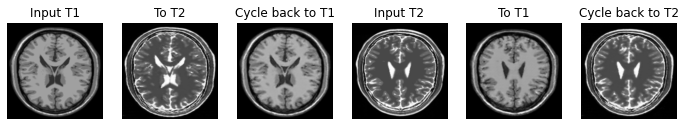

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-55
Epoch 56/150
Generator G Loss: 1.8249, Generator F Loss: 1.7860
Discriminator X Loss: 0.7060, Discriminator Y Loss: 0.6962


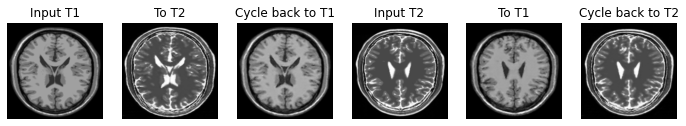

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-56
Epoch 57/150
Generator G Loss: 1.8088, Generator F Loss: 1.7631
Discriminator X Loss: 0.6904, Discriminator Y Loss: 0.7064


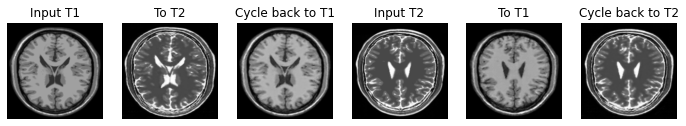

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-57
Epoch 58/150
Generator G Loss: 1.7615, Generator F Loss: 1.7151
Discriminator X Loss: 0.6946, Discriminator Y Loss: 0.6990


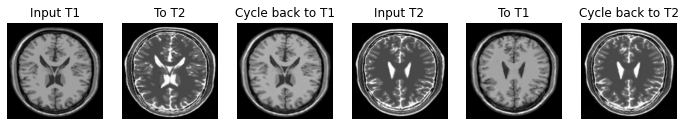

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-58
Epoch 59/150
Generator G Loss: 1.7307, Generator F Loss: 1.7172
Discriminator X Loss: 0.6955, Discriminator Y Loss: 0.7012


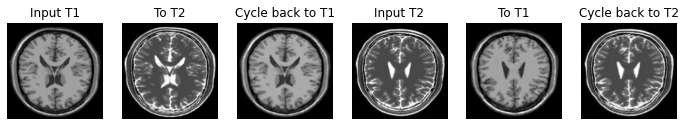

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-59
Epoch 60/150
Generator G Loss: 1.7238, Generator F Loss: 1.7011
Discriminator X Loss: 0.6939, Discriminator Y Loss: 0.7029


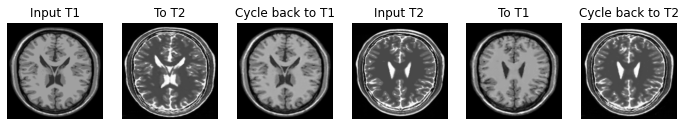

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-60
Epoch 61/150
Generator G Loss: 1.6930, Generator F Loss: 1.6714
Discriminator X Loss: 0.7027, Discriminator Y Loss: 0.7011


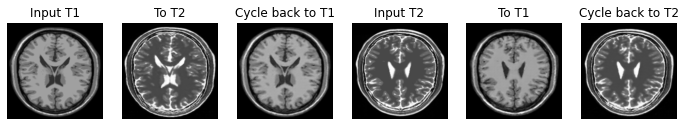

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-61
Epoch 62/150
Generator G Loss: 1.6725, Generator F Loss: 1.6473
Discriminator X Loss: 0.6967, Discriminator Y Loss: 0.7088


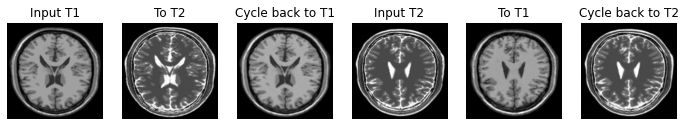

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-62
Epoch 63/150
Generator G Loss: 1.6545, Generator F Loss: 1.6371
Discriminator X Loss: 0.6929, Discriminator Y Loss: 0.7047


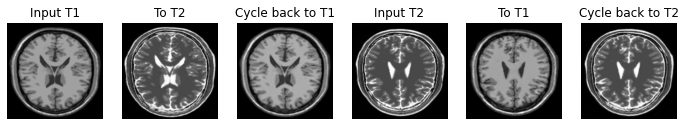

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-63
Epoch 64/150
Generator G Loss: 1.6379, Generator F Loss: 1.6272
Discriminator X Loss: 0.6908, Discriminator Y Loss: 0.6895


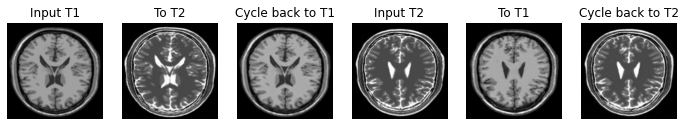

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-64
Epoch 65/150
Generator G Loss: 1.6284, Generator F Loss: 1.5995
Discriminator X Loss: 0.6942, Discriminator Y Loss: 0.6971


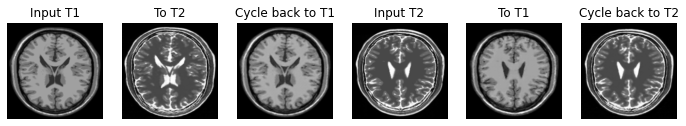

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-65
Epoch 66/150
Generator G Loss: 1.5942, Generator F Loss: 1.5773
Discriminator X Loss: 0.6949, Discriminator Y Loss: 0.7009


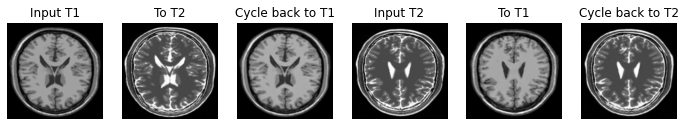

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-66
Epoch 67/150
Generator G Loss: 1.5877, Generator F Loss: 1.5631
Discriminator X Loss: 0.6950, Discriminator Y Loss: 0.6989


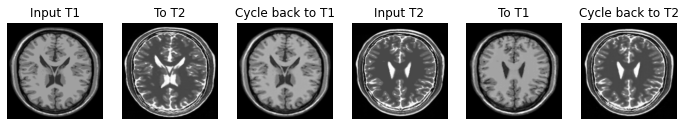

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-67
Epoch 68/150
Generator G Loss: 1.5865, Generator F Loss: 1.5798
Discriminator X Loss: 0.6921, Discriminator Y Loss: 0.6982


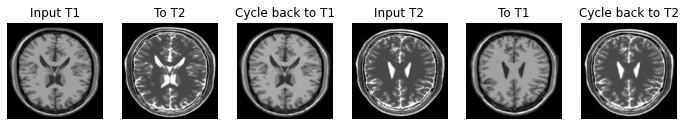

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-68
Epoch 69/150
Generator G Loss: 1.5759, Generator F Loss: 1.5618
Discriminator X Loss: 0.6942, Discriminator Y Loss: 0.6952


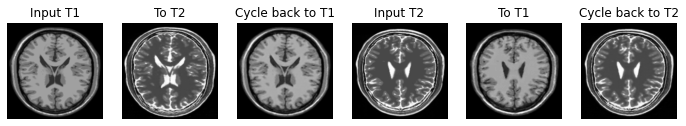

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-69
Epoch 70/150
Generator G Loss: 1.5655, Generator F Loss: 1.5419
Discriminator X Loss: 0.6934, Discriminator Y Loss: 0.7016


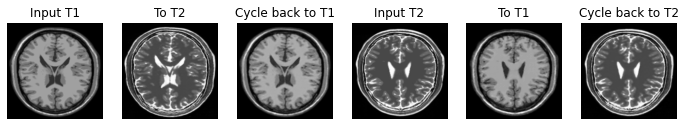

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-70
Epoch 71/150
Generator G Loss: 1.5337, Generator F Loss: 1.5173
Discriminator X Loss: 0.6951, Discriminator Y Loss: 0.6952


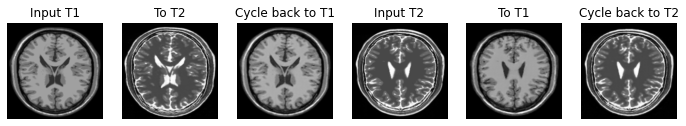

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-71
Epoch 72/150
Generator G Loss: 1.5230, Generator F Loss: 1.5129
Discriminator X Loss: 0.6900, Discriminator Y Loss: 0.6987


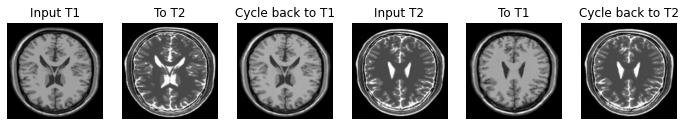

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-72
Epoch 73/150
Generator G Loss: 1.5117, Generator F Loss: 1.4977
Discriminator X Loss: 0.6914, Discriminator Y Loss: 0.6919


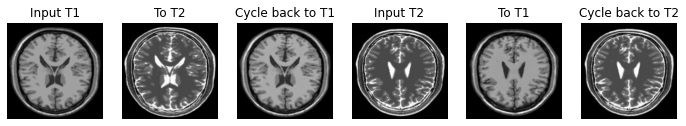

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-73
Epoch 74/150
Generator G Loss: 1.5296, Generator F Loss: 1.5094
Discriminator X Loss: 0.6910, Discriminator Y Loss: 0.6980


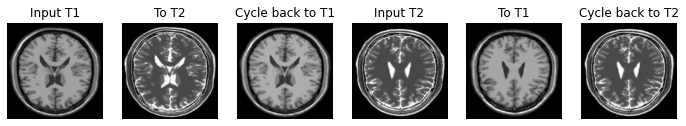

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-74
Epoch 75/150
Generator G Loss: 1.5075, Generator F Loss: 1.4994
Discriminator X Loss: 0.7016, Discriminator Y Loss: 0.6964


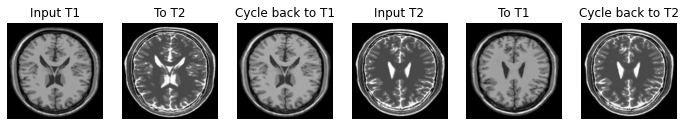

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-75
Epoch 76/150
Generator G Loss: 1.5016, Generator F Loss: 1.4820
Discriminator X Loss: 0.6997, Discriminator Y Loss: 0.6985


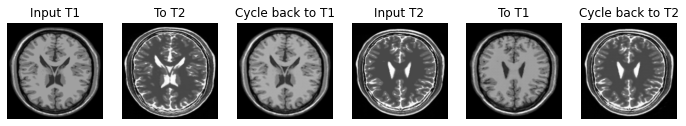

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-76
Epoch 77/150
Generator G Loss: 1.4596, Generator F Loss: 1.4564
Discriminator X Loss: 0.6964, Discriminator Y Loss: 0.7032


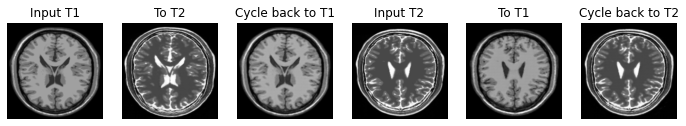

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-77
Epoch 78/150
Generator G Loss: 1.4650, Generator F Loss: 1.4415
Discriminator X Loss: 0.6914, Discriminator Y Loss: 0.6932


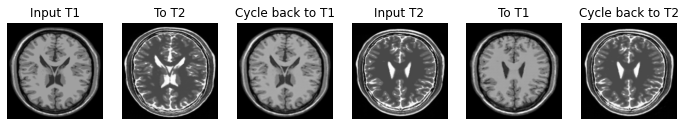

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-78
Epoch 79/150
Generator G Loss: 1.4595, Generator F Loss: 1.4594
Discriminator X Loss: 0.6928, Discriminator Y Loss: 0.6971


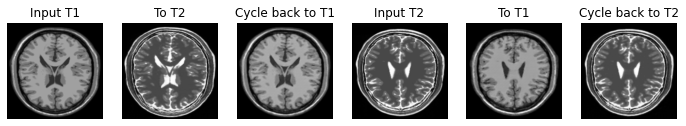

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-79
Epoch 80/150
Generator G Loss: 1.4552, Generator F Loss: 1.4428
Discriminator X Loss: 0.6903, Discriminator Y Loss: 0.6963


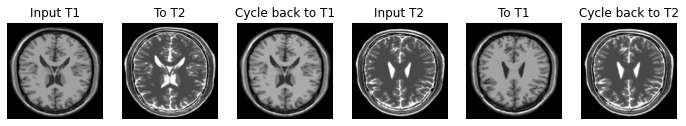

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-80
Epoch 81/150
Generator G Loss: 1.4465, Generator F Loss: 1.4267
Discriminator X Loss: 0.6919, Discriminator Y Loss: 0.6976


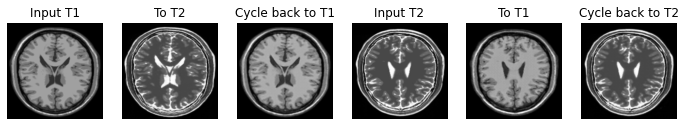

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-81
Epoch 82/150
Generator G Loss: 1.4357, Generator F Loss: 1.4421
Discriminator X Loss: 0.6902, Discriminator Y Loss: 0.6948


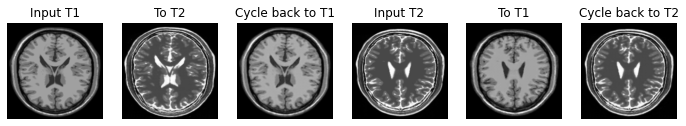

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-82
Epoch 83/150
Generator G Loss: 1.4413, Generator F Loss: 1.4289
Discriminator X Loss: 0.7034, Discriminator Y Loss: 0.7018


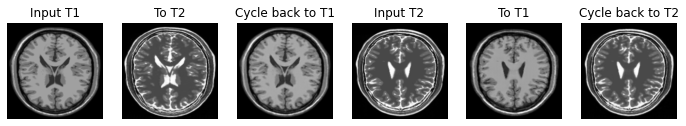

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-83
Epoch 84/150
Generator G Loss: 1.4168, Generator F Loss: 1.4056
Discriminator X Loss: 0.6963, Discriminator Y Loss: 0.6988


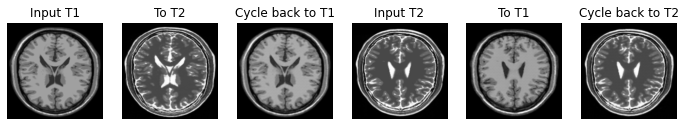

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-84
Epoch 85/150
Generator G Loss: 1.4256, Generator F Loss: 1.4319
Discriminator X Loss: 0.6777, Discriminator Y Loss: 0.6969


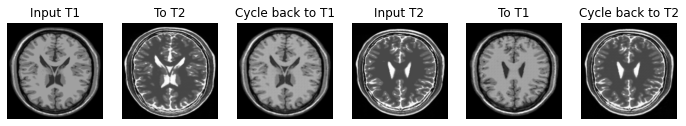

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-85
Epoch 86/150
Generator G Loss: 2.3328, Generator F Loss: 4.1913
Discriminator X Loss: 0.2546, Discriminator Y Loss: 0.6752


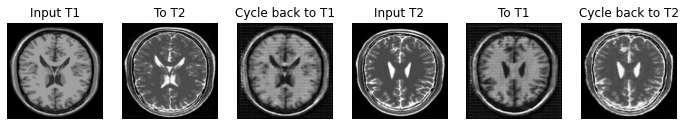

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-86
Epoch 87/150
Generator G Loss: 4.1473, Generator F Loss: 8.6263
Discriminator X Loss: 0.0971, Discriminator Y Loss: 0.6136


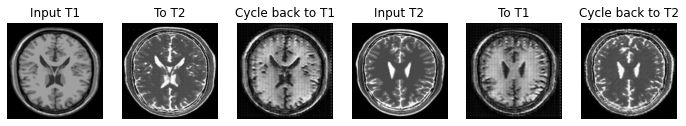

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-87
Epoch 88/150
Generator G Loss: 3.5322, Generator F Loss: 8.6381
Discriminator X Loss: 0.0889, Discriminator Y Loss: 0.6226


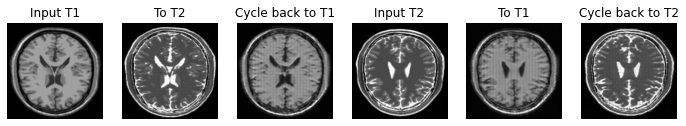

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-88
Epoch 89/150
Generator G Loss: 3.5313, Generator F Loss: 7.6826
Discriminator X Loss: 0.1914, Discriminator Y Loss: 0.5306


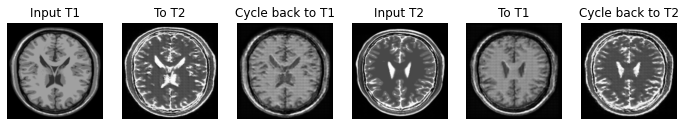

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-89
Epoch 90/150
Generator G Loss: 7.2975, Generator F Loss: 7.2917
Discriminator X Loss: 0.2134, Discriminator Y Loss: 0.1393


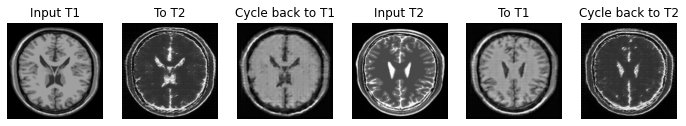

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-90
Epoch 91/150
Generator G Loss: 9.2317, Generator F Loss: 7.0449
Discriminator X Loss: 0.2974, Discriminator Y Loss: 0.0534


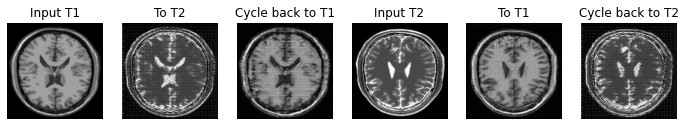

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-91
Epoch 92/150
Generator G Loss: 10.3950, Generator F Loss: 5.0833
Discriminator X Loss: 0.4663, Discriminator Y Loss: 0.0695


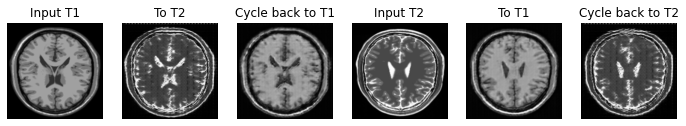

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-92
Epoch 93/150
Generator G Loss: 10.7403, Generator F Loss: 5.4975
Discriminator X Loss: 0.2471, Discriminator Y Loss: 0.1828


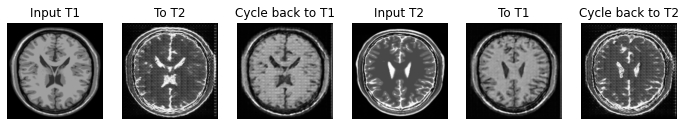

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-93
Epoch 94/150
Generator G Loss: 9.5133, Generator F Loss: 6.4892
Discriminator X Loss: 0.3303, Discriminator Y Loss: 0.0558


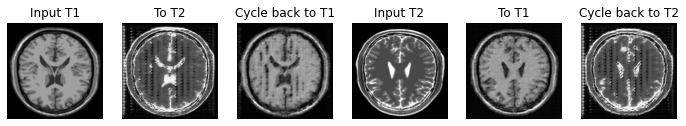

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-94
Epoch 95/150
Generator G Loss: 9.5911, Generator F Loss: 5.6636
Discriminator X Loss: 0.4153, Discriminator Y Loss: 0.1451


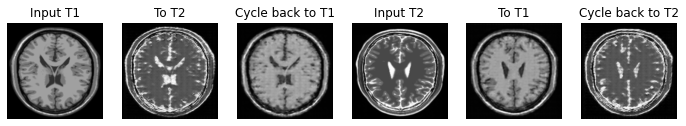

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-95
Epoch 96/150
Generator G Loss: 7.2767, Generator F Loss: 5.0452
Discriminator X Loss: 0.3480, Discriminator Y Loss: 0.2118


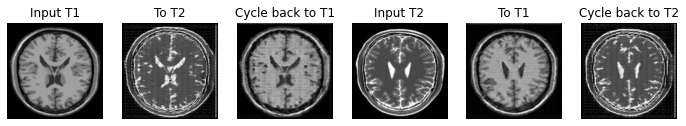

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-96
Epoch 97/150
Generator G Loss: 7.0316, Generator F Loss: 4.8999
Discriminator X Loss: 0.4678, Discriminator Y Loss: 0.3252


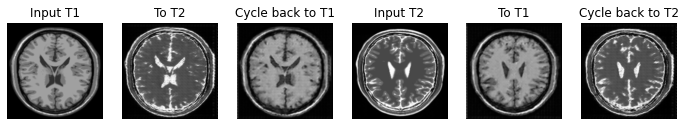

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-97
Epoch 98/150
Generator G Loss: 7.6937, Generator F Loss: 4.1089
Discriminator X Loss: 0.5066, Discriminator Y Loss: 0.1214


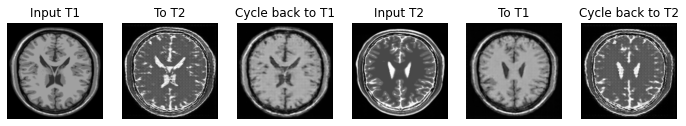

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-98
Epoch 99/150
Generator G Loss: 8.1970, Generator F Loss: 4.4149
Discriminator X Loss: 0.4685, Discriminator Y Loss: 0.1693


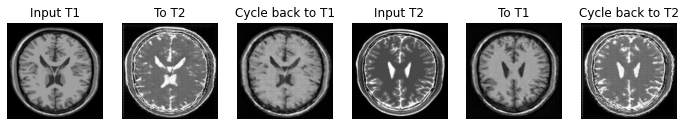

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-99
Epoch 100/150
Generator G Loss: 7.4862, Generator F Loss: 5.1914
Discriminator X Loss: 0.3763, Discriminator Y Loss: 0.1506


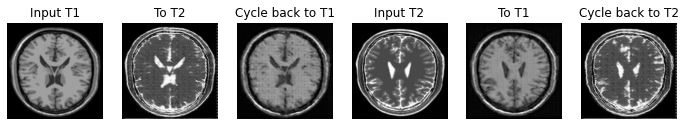

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-100
Epoch 101/150
Generator G Loss: 9.6626, Generator F Loss: 4.1475
Discriminator X Loss: 0.6302, Discriminator Y Loss: 0.0975


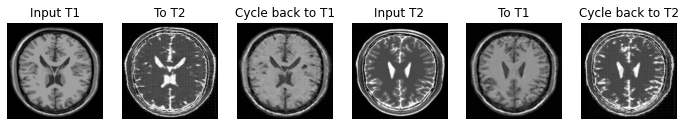

Saving checkpoint for epoch 101 at ./Trained_Model/ckpt-101
Epoch 102/150
Generator G Loss: 11.6585, Generator F Loss: 3.7121
Discriminator X Loss: 0.6201, Discriminator Y Loss: 0.0346


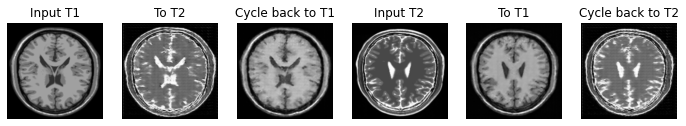

Saving checkpoint for epoch 102 at ./Trained_Model/ckpt-102
Epoch 103/150
Generator G Loss: 7.6837, Generator F Loss: 3.4913
Discriminator X Loss: 0.6258, Discriminator Y Loss: 0.2793


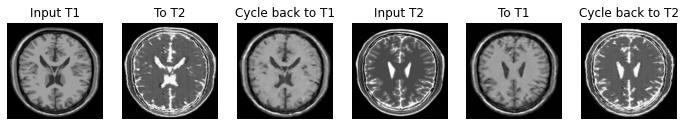

Saving checkpoint for epoch 103 at ./Trained_Model/ckpt-103
Epoch 104/150
Generator G Loss: 6.8650, Generator F Loss: 3.1372
Discriminator X Loss: 0.6429, Discriminator Y Loss: 0.2117


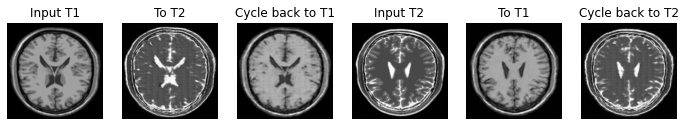

Saving checkpoint for epoch 104 at ./Trained_Model/ckpt-104
Epoch 105/150
Generator G Loss: 6.6257, Generator F Loss: 3.2594
Discriminator X Loss: 0.6621, Discriminator Y Loss: 0.3408


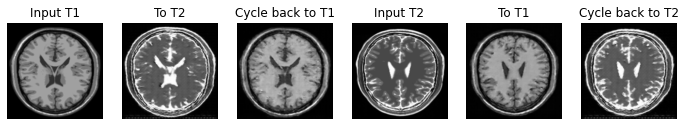

Saving checkpoint for epoch 105 at ./Trained_Model/ckpt-105
Epoch 106/150
Generator G Loss: 8.9003, Generator F Loss: 3.5121
Discriminator X Loss: 0.6322, Discriminator Y Loss: 0.0562


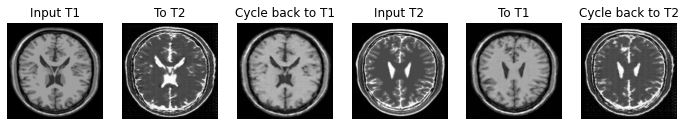

Saving checkpoint for epoch 106 at ./Trained_Model/ckpt-106
Epoch 107/150
Generator G Loss: 11.4738, Generator F Loss: 3.2415
Discriminator X Loss: 0.6132, Discriminator Y Loss: 0.1049


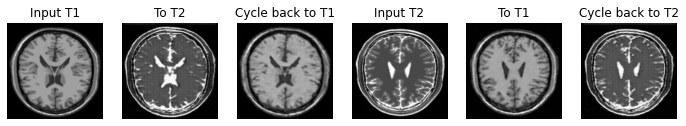

Saving checkpoint for epoch 107 at ./Trained_Model/ckpt-107
Epoch 108/150
Generator G Loss: 5.3458, Generator F Loss: 2.9484
Discriminator X Loss: 0.6470, Discriminator Y Loss: 0.4163


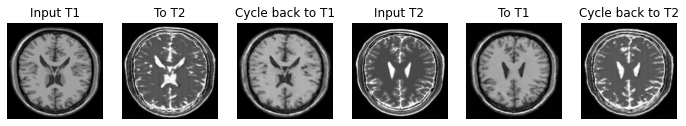

Saving checkpoint for epoch 108 at ./Trained_Model/ckpt-108
Epoch 109/150
Generator G Loss: 7.8124, Generator F Loss: 3.0964
Discriminator X Loss: 0.6435, Discriminator Y Loss: 0.1729


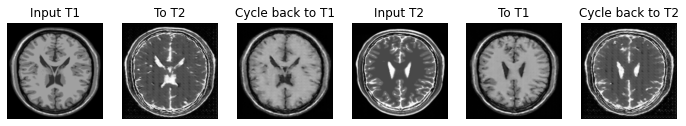

Saving checkpoint for epoch 109 at ./Trained_Model/ckpt-109
Epoch 110/150
Generator G Loss: 6.8316, Generator F Loss: 2.8764
Discriminator X Loss: 0.6587, Discriminator Y Loss: 0.3101


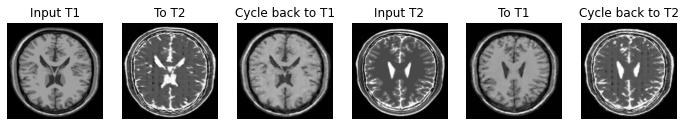

Saving checkpoint for epoch 110 at ./Trained_Model/ckpt-110
Epoch 111/150
Generator G Loss: 5.4214, Generator F Loss: 2.8392
Discriminator X Loss: 0.6652, Discriminator Y Loss: 0.2964


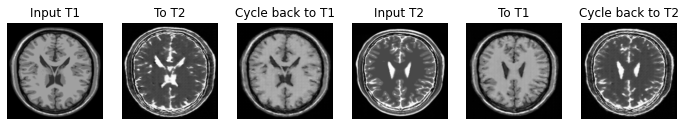

Saving checkpoint for epoch 111 at ./Trained_Model/ckpt-111
Epoch 112/150
Generator G Loss: 9.0306, Generator F Loss: 2.8609
Discriminator X Loss: 0.6686, Discriminator Y Loss: 0.1746


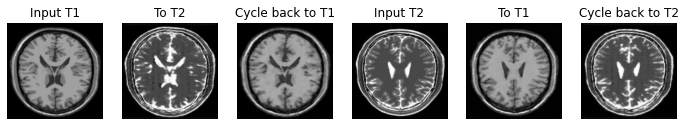

Saving checkpoint for epoch 112 at ./Trained_Model/ckpt-112
Epoch 113/150
Generator G Loss: 8.5320, Generator F Loss: 2.9293
Discriminator X Loss: 0.6792, Discriminator Y Loss: 0.1055


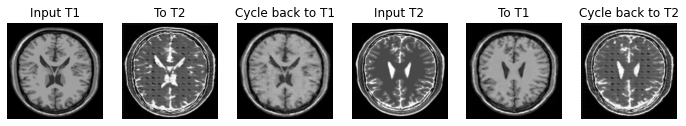

Saving checkpoint for epoch 113 at ./Trained_Model/ckpt-113
Epoch 114/150
Generator G Loss: 13.0659, Generator F Loss: 3.0042
Discriminator X Loss: 0.6583, Discriminator Y Loss: 0.1515


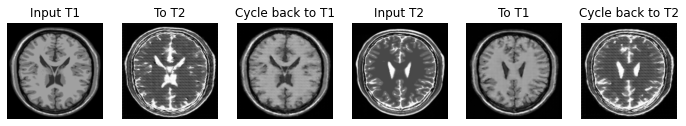

Saving checkpoint for epoch 114 at ./Trained_Model/ckpt-114
Epoch 115/150
Generator G Loss: 7.7906, Generator F Loss: 2.8638
Discriminator X Loss: 0.6673, Discriminator Y Loss: 0.2789


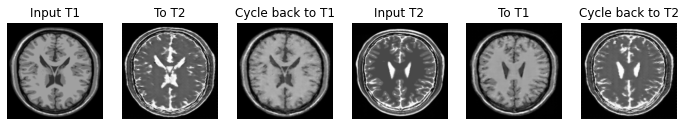

Saving checkpoint for epoch 115 at ./Trained_Model/ckpt-115
Epoch 116/150
Generator G Loss: 3.7189, Generator F Loss: 2.6261
Discriminator X Loss: 0.6822, Discriminator Y Loss: 0.5635


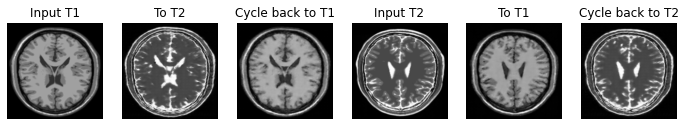

Saving checkpoint for epoch 116 at ./Trained_Model/ckpt-116
Epoch 117/150
Generator G Loss: 2.6822, Generator F Loss: 2.4875
Discriminator X Loss: 0.6551, Discriminator Y Loss: 0.7020


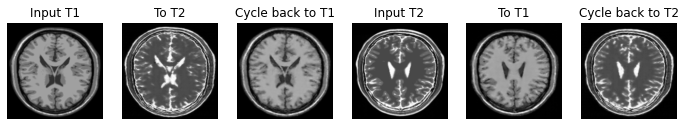

Saving checkpoint for epoch 117 at ./Trained_Model/ckpt-117
Epoch 118/150
Generator G Loss: 2.6330, Generator F Loss: 2.3709
Discriminator X Loss: 0.6876, Discriminator Y Loss: 0.6531


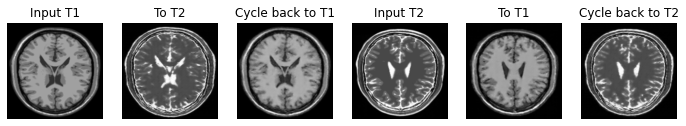

Saving checkpoint for epoch 118 at ./Trained_Model/ckpt-118
Epoch 119/150
Generator G Loss: 2.5573, Generator F Loss: 2.2637
Discriminator X Loss: 0.6764, Discriminator Y Loss: 0.6014


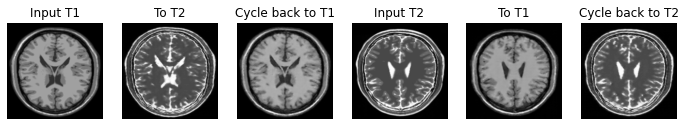

Saving checkpoint for epoch 119 at ./Trained_Model/ckpt-119
Epoch 120/150
Generator G Loss: 2.6117, Generator F Loss: 2.2324
Discriminator X Loss: 0.6648, Discriminator Y Loss: 0.5806


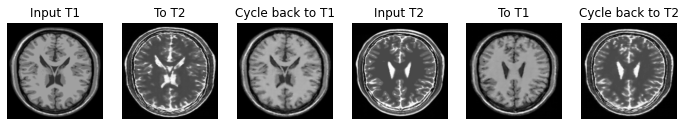

Saving checkpoint for epoch 120 at ./Trained_Model/ckpt-120
Epoch 121/150
Generator G Loss: 2.6270, Generator F Loss: 2.2165
Discriminator X Loss: 0.6789, Discriminator Y Loss: 0.5612


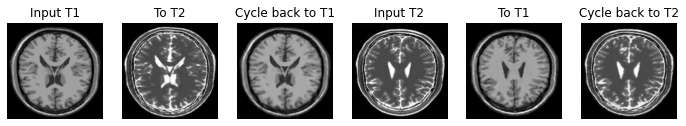

Saving checkpoint for epoch 121 at ./Trained_Model/ckpt-121
Epoch 122/150
Generator G Loss: 2.5935, Generator F Loss: 2.1628
Discriminator X Loss: 0.6941, Discriminator Y Loss: 0.6613


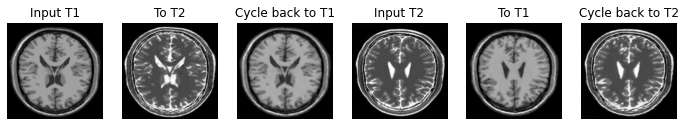

Saving checkpoint for epoch 122 at ./Trained_Model/ckpt-122
Epoch 123/150
Generator G Loss: 2.4148, Generator F Loss: 2.1436
Discriminator X Loss: 0.6852, Discriminator Y Loss: 0.6621


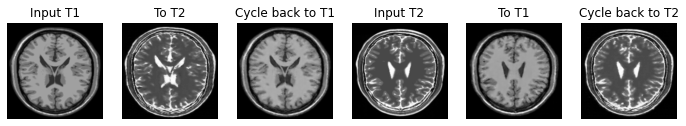

Saving checkpoint for epoch 123 at ./Trained_Model/ckpt-123
Epoch 124/150
Generator G Loss: 2.4180, Generator F Loss: 2.0867
Discriminator X Loss: 0.6942, Discriminator Y Loss: 0.6007


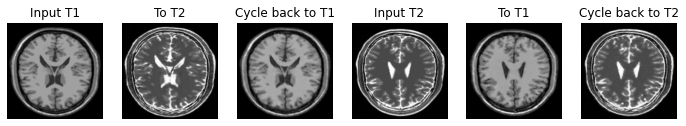

Saving checkpoint for epoch 124 at ./Trained_Model/ckpt-124
Epoch 125/150
Generator G Loss: 2.3411, Generator F Loss: 2.0346
Discriminator X Loss: 0.6991, Discriminator Y Loss: 0.6235


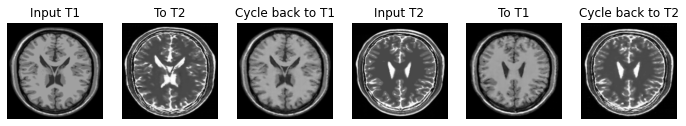

Saving checkpoint for epoch 125 at ./Trained_Model/ckpt-125
Epoch 126/150
Generator G Loss: 2.3503, Generator F Loss: 2.0042
Discriminator X Loss: 0.6787, Discriminator Y Loss: 0.6137


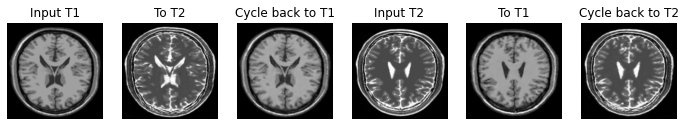

Saving checkpoint for epoch 126 at ./Trained_Model/ckpt-126
Epoch 127/150
Generator G Loss: 2.2914, Generator F Loss: 2.0050
Discriminator X Loss: 0.6929, Discriminator Y Loss: 0.6241


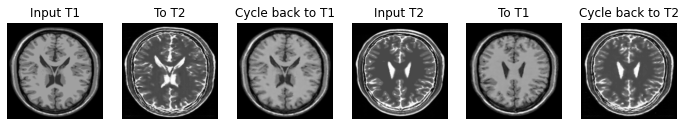

Saving checkpoint for epoch 127 at ./Trained_Model/ckpt-127
Epoch 128/150
Generator G Loss: 2.2551, Generator F Loss: 1.9808
Discriminator X Loss: 0.6864, Discriminator Y Loss: 0.6055


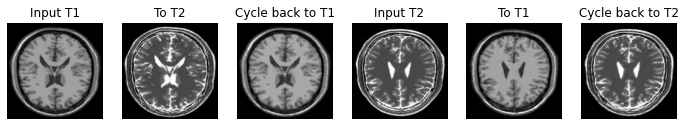

Saving checkpoint for epoch 128 at ./Trained_Model/ckpt-128
Epoch 129/150
Generator G Loss: 2.2458, Generator F Loss: 1.9893
Discriminator X Loss: 0.6924, Discriminator Y Loss: 0.6571


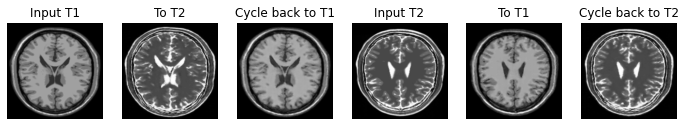

Saving checkpoint for epoch 129 at ./Trained_Model/ckpt-129
Epoch 130/150
Generator G Loss: 2.1894, Generator F Loss: 1.9539
Discriminator X Loss: 0.6874, Discriminator Y Loss: 0.6335


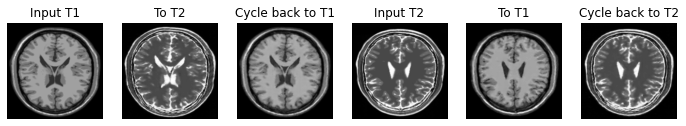

Saving checkpoint for epoch 130 at ./Trained_Model/ckpt-130
Epoch 131/150
Generator G Loss: 2.1582, Generator F Loss: 1.9316
Discriminator X Loss: 0.6814, Discriminator Y Loss: 0.6766


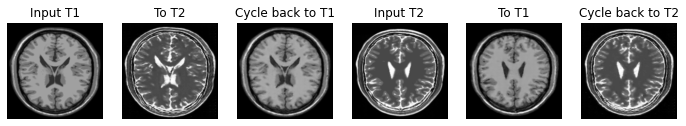

Saving checkpoint for epoch 131 at ./Trained_Model/ckpt-131
Epoch 132/150
Generator G Loss: 2.0811, Generator F Loss: 1.8852
Discriminator X Loss: 0.6841, Discriminator Y Loss: 0.6707


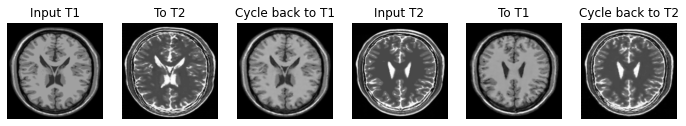

Saving checkpoint for epoch 132 at ./Trained_Model/ckpt-132
Epoch 133/150
Generator G Loss: 2.0612, Generator F Loss: 1.9136
Discriminator X Loss: 0.6844, Discriminator Y Loss: 0.6576


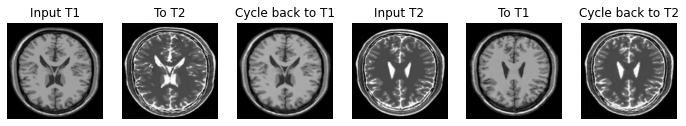

Saving checkpoint for epoch 133 at ./Trained_Model/ckpt-133
Epoch 134/150
Generator G Loss: 2.0299, Generator F Loss: 1.8627
Discriminator X Loss: 0.6876, Discriminator Y Loss: 0.6808


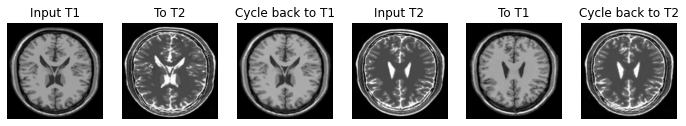

Saving checkpoint for epoch 134 at ./Trained_Model/ckpt-134
Epoch 135/150
Generator G Loss: 1.9525, Generator F Loss: 1.8201
Discriminator X Loss: 0.6963, Discriminator Y Loss: 0.7000


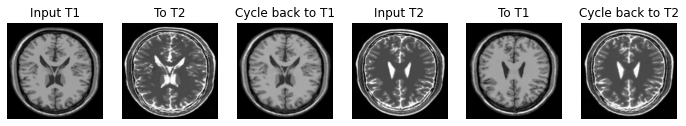

Saving checkpoint for epoch 135 at ./Trained_Model/ckpt-135
Epoch 136/150
Generator G Loss: 1.8930, Generator F Loss: 1.7993
Discriminator X Loss: 0.6862, Discriminator Y Loss: 0.6776


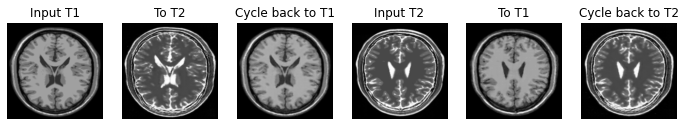

Saving checkpoint for epoch 136 at ./Trained_Model/ckpt-136
Epoch 137/150
Generator G Loss: 1.8928, Generator F Loss: 1.7701
Discriminator X Loss: 0.6799, Discriminator Y Loss: 0.6716


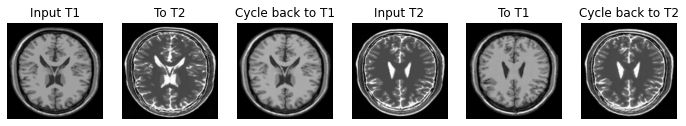

Saving checkpoint for epoch 137 at ./Trained_Model/ckpt-137
Epoch 138/150
Generator G Loss: 1.7972, Generator F Loss: 1.7852
Discriminator X Loss: 0.6885, Discriminator Y Loss: 0.7237


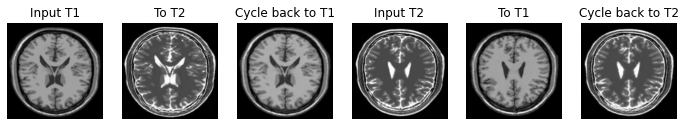

Saving checkpoint for epoch 138 at ./Trained_Model/ckpt-138
Epoch 139/150
Generator G Loss: 1.8254, Generator F Loss: 1.7310
Discriminator X Loss: 0.6927, Discriminator Y Loss: 0.6812


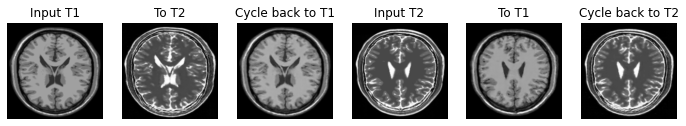

Saving checkpoint for epoch 139 at ./Trained_Model/ckpt-139
Epoch 140/150
Generator G Loss: 1.7868, Generator F Loss: 1.7312
Discriminator X Loss: 0.6949, Discriminator Y Loss: 0.7107


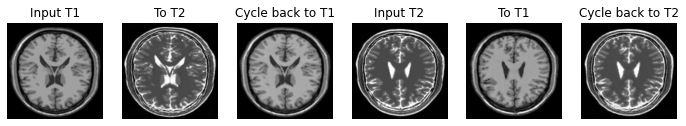

Saving checkpoint for epoch 140 at ./Trained_Model/ckpt-140
Epoch 141/150
Generator G Loss: 1.7703, Generator F Loss: 1.6919
Discriminator X Loss: 0.6926, Discriminator Y Loss: 0.6892


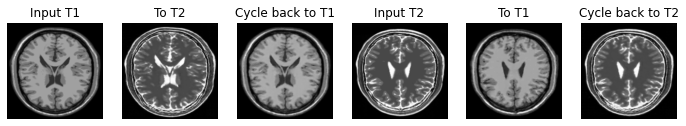

Saving checkpoint for epoch 141 at ./Trained_Model/ckpt-141
Epoch 142/150
Generator G Loss: 1.7223, Generator F Loss: 1.6538
Discriminator X Loss: 0.6918, Discriminator Y Loss: 0.6837


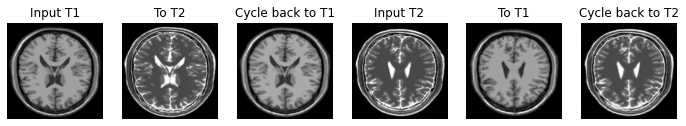

Saving checkpoint for epoch 142 at ./Trained_Model/ckpt-142
Epoch 143/150
Generator G Loss: 1.6781, Generator F Loss: 1.6414
Discriminator X Loss: 0.6914, Discriminator Y Loss: 0.6960


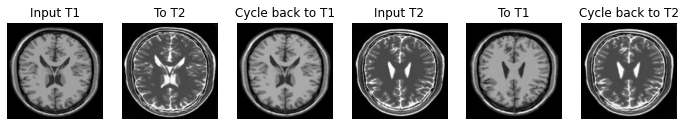

Saving checkpoint for epoch 143 at ./Trained_Model/ckpt-143
Epoch 144/150
Generator G Loss: 1.7150, Generator F Loss: 1.6416
Discriminator X Loss: 0.6856, Discriminator Y Loss: 0.6742


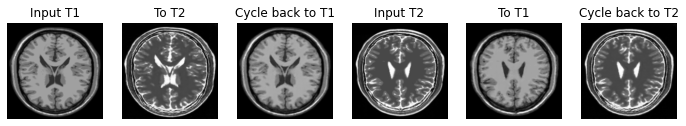

Saving checkpoint for epoch 144 at ./Trained_Model/ckpt-144
Epoch 145/150
Generator G Loss: 1.6699, Generator F Loss: 1.6330
Discriminator X Loss: 0.6918, Discriminator Y Loss: 0.6891


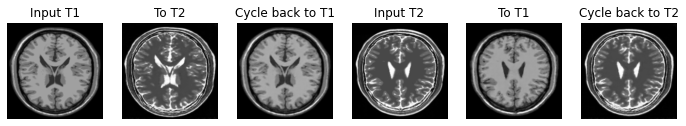

Saving checkpoint for epoch 145 at ./Trained_Model/ckpt-145
Epoch 146/150
Generator G Loss: 1.6727, Generator F Loss: 1.5988
Discriminator X Loss: 0.6869, Discriminator Y Loss: 0.6758


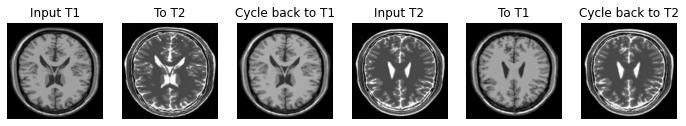

Saving checkpoint for epoch 146 at ./Trained_Model/ckpt-146
Epoch 147/150
Generator G Loss: 1.6382, Generator F Loss: 1.6112
Discriminator X Loss: 0.7003, Discriminator Y Loss: 0.6940


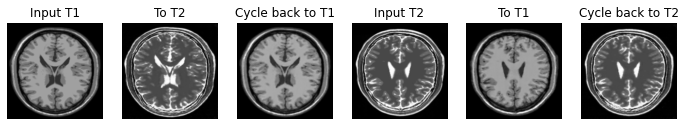

Saving checkpoint for epoch 147 at ./Trained_Model/ckpt-147
Epoch 148/150
Generator G Loss: 1.6718, Generator F Loss: 1.5989
Discriminator X Loss: 0.6870, Discriminator Y Loss: 0.6817


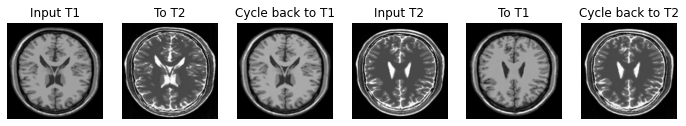

Saving checkpoint for epoch 148 at ./Trained_Model/ckpt-148
Epoch 149/150
Generator G Loss: 1.6289, Generator F Loss: 1.6004
Discriminator X Loss: 0.6839, Discriminator Y Loss: 0.7097


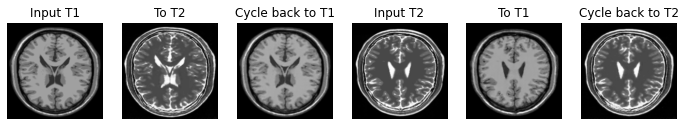

Saving checkpoint for epoch 149 at ./Trained_Model/ckpt-149
Epoch 150/150
Generator G Loss: 1.6036, Generator F Loss: 1.5980
Discriminator X Loss: 0.6793, Discriminator Y Loss: 0.6930


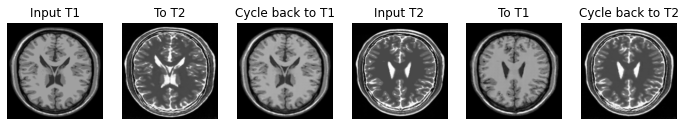

Saving checkpoint for epoch 150 at ./Trained_Model/ckpt-150


In [37]:
#Assigning sample images that we will use to visually check progress
sample_t1_image = next(iter(t1_dataset.skip(3).take(1)))
sample_t2_image = next(iter(t2_dataset.skip(3).take(1)))


# 1. Initialization - List to hold Losses
gen_g_losses = []
gen_f_losses = []
disc_x_losses = []
disc_y_losses = []

for epoch in range(1, EPOCHS+1):
    # Temporary lists to store losses for each batch in an epoch
    temp_gen_g_losses = []
    temp_gen_f_losses = []
    temp_disc_x_losses = []
    temp_disc_y_losses = []
    
    for image_x, image_y in tf.data.Dataset.zip((t1_dataset, t2_dataset)):
        # 2. Inside the Training Loop
        g_loss, f_loss, x_loss, y_loss = train_step(image_x, image_y)
        
        temp_gen_g_losses.append(g_loss)
        temp_gen_f_losses.append(f_loss)
        temp_disc_x_losses.append(x_loss)
        temp_disc_y_losses.append(y_loss)
    
    # 3. End of Each Epoch
    avg_gen_g_loss = np.mean(temp_gen_g_losses)
    avg_gen_f_loss = np.mean(temp_gen_f_losses)
    avg_disc_x_loss = np.mean(temp_disc_x_losses)
    avg_disc_y_losses = np.mean(temp_disc_y_losses)
    
    gen_g_losses.append(avg_gen_g_loss)
    gen_f_losses.append(avg_gen_f_loss)
    disc_x_losses.append(avg_disc_x_loss)
    disc_y_losses.append(avg_disc_y_losses)

    print(f"Epoch {epoch}/{EPOCHS}")
    print(f"Generator G Loss: {avg_gen_g_loss:.4f}, Generator F Loss: {avg_gen_f_loss:.4f}")
    print(f"Discriminator X Loss: {avg_disc_x_loss:.4f}, Discriminator Y Loss: {avg_disc_y_losses:.4f}")

    generate_images(generator_g, sample_t1_image, generator_f, sample_t2_image)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)


#### Visualizing Losses Over Epoch

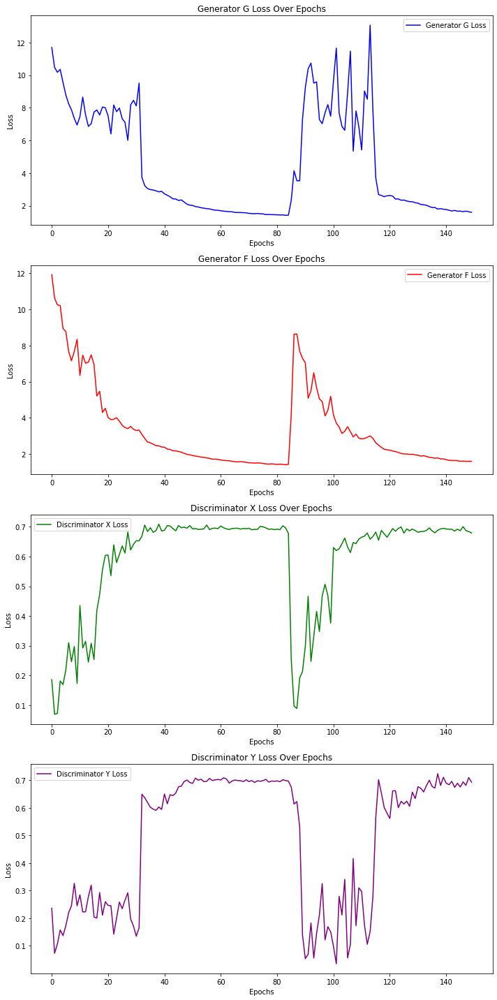

In [38]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 1, figsize=(10, 20))

# Plot Generator G Loss
axes[0].plot(gen_g_losses, label='Generator G Loss', color='blue')
axes[0].set_title('Generator G Loss Over Epochs')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()

# Plot Generator F Loss
axes[1].plot(gen_f_losses, label='Generator F Loss', color='red')
axes[1].set_title('Generator F Loss Over Epochs')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()

# Plot Discriminator X Loss
axes[2].plot(disc_x_losses, label='Discriminator X Loss', color='green')
axes[2].set_title('Discriminator X Loss Over Epochs')
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Plot Discriminator Y Loss
axes[3].plot(disc_y_losses, label='Discriminator Y Loss', color='purple')
axes[3].set_title('Discriminator Y Loss Over Epochs')
axes[3].set_xlabel('Epochs')
axes[3].set_ylabel('Loss')
axes[3].legend()

# Adjust the layout and show the plots
plt.tight_layout()
plt.show()


In [39]:
#Generating Gif to Visualize our CYCLEGAN

In [46]:
# The pngs that we dumped while training
current_directory = os.getcwd()
# Get a list of all PNG files in the folder, sorted by filename
png_paths = sorted([filename for filename in os.listdir(current_directory) if filename.endswith(".png")])

In [47]:
# Making the Gif
with Image.open(png_paths[0]) as img:
    img_size = img.size

# Create a new GIF image
gif_images = []
for png_path in png_paths:
    with Image.open(png_path) as img:
        gif_images.append(img.resize(img_size))

# Save the GIF
gif_path = "output.gif"
gif_images[0].save(gif_path, save_all=True, append_images=gif_images[1:], duration=200, loop=0)

###  FINAL RESULT!

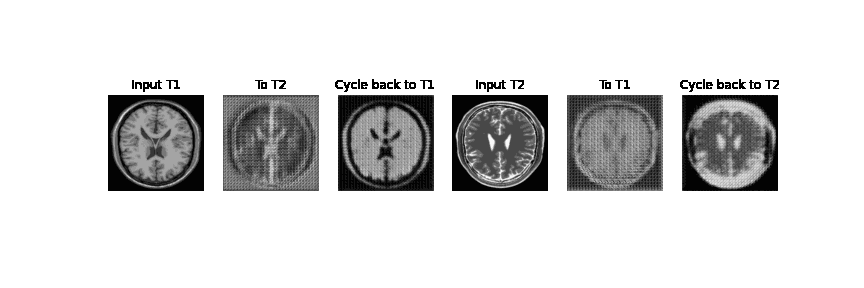

In [50]:
from IPython.display import Image, display

# Display the GIF in the notebook
display(Image(filename=gif_path))


In [ ]:
# The results look good!!!